In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 17.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1297, done.
remote: Counting objects: 100% (70/70), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 1297 (delta 39), reused 49 (delta 24), pack-reused 1227
Receiving objects: 100% (1297/1297), 57.45 MiB | 15.10 MiB/s, done.
Resolving deltas: 100% (923/923), done.


In [ ]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_BimodelPrior import make_lm_program_beta_prior, make_lm_program_beta_prior_batched


from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2, TransformerPlusNLP
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
make_lm_program = make_lm_program_beta_prior
make_lm_program_batched= make_lm_program_beta_prior_batched

N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InvGammaBetaPrior_LearnedBaseDist_plus_nll_v1"
#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
alpha_betadist = 0.5
beta_betadist = 0.5

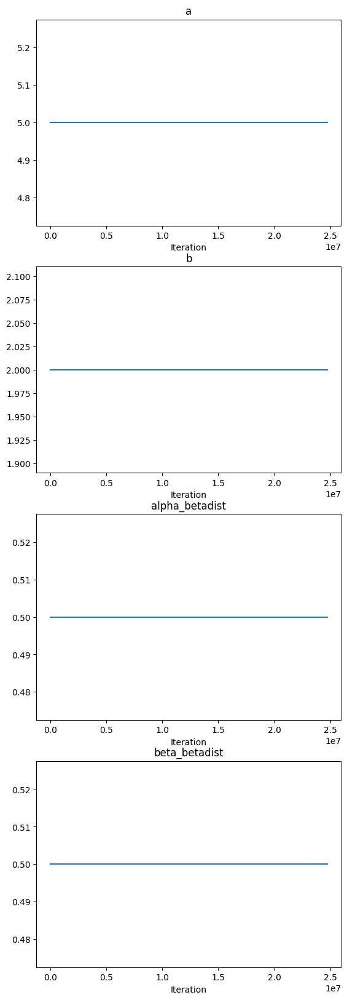

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),
    ("alpha_betadist", curriculum.constant_scheduler(alpha_betadist)),
    ("beta_betadist", curriculum.constant_scheduler(beta_betadist)),
    ]
)

curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'a': 5.0, 'b': 2.0, 'alpha_betadist': 0.5, 'beta_betadist': 0.5}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_batched,
    curriculum= curriculum,
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 12.65it/s]

torch.Size([10000, 5])
{'X': {'mean': tensor(0.5003), 'variance': tensor(0.0834), 'min': tensor(1.7881e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.2613), 'variance': tensor(0.6394), 'min': tensor(-6.1642), 'max': tensor(8.7874)}, 'beta': {'mean': tensor([0.5034, 0.5093, 0.4969, 0.5150, 0.4966]), 'variance': tensor([0.1260, 0.1264, 0.1244, 0.1244, 0.1286]), 'min': tensor([2.4726e-06, 3.7475e-08, 1.5087e-07, 5.6302e-06, 9.2298e-07]), 'max': tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000])}}
Statistics for sigma_squared:
Mean: tensor([0.4984])
Variance: tensor([0.0747])
Min: tensor([0.1175])
Max: tensor([2.6840])


Statistics for time:
Mean: 0.4936136936303228
Variance: 0.0842681106069153
Min: 0.0010530352592468262
Max: 0.9999745488166809


Statistics for base_sample_beta:
Mean: tensor([ 0.0023,  0.0203, -0.0004,  0.0014, -0.0125])
Variance: tensor([1.0144, 1.0237, 0.9867, 1.0136, 1.0039])
Min: tensor([-3.1082, -3.7854, -3.3667, -3.3039, -3.1392])
Max: tensor([3.5045, 3.2731, 3.4

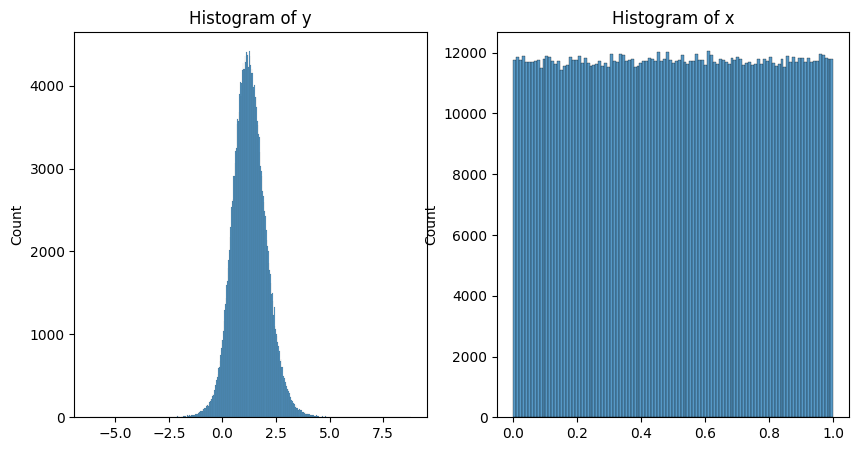

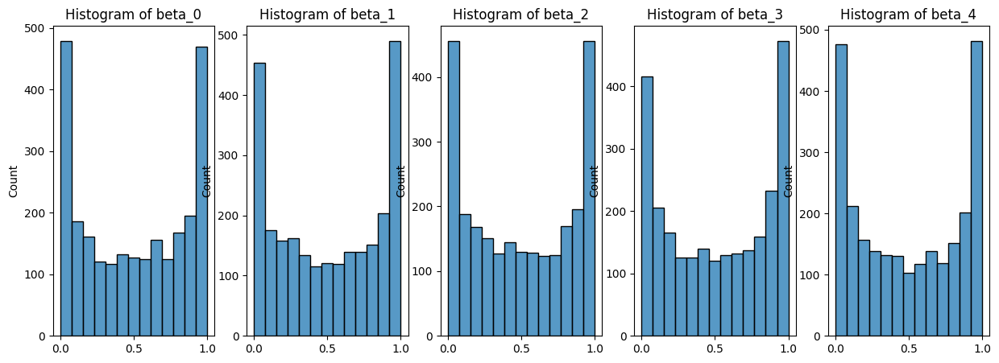

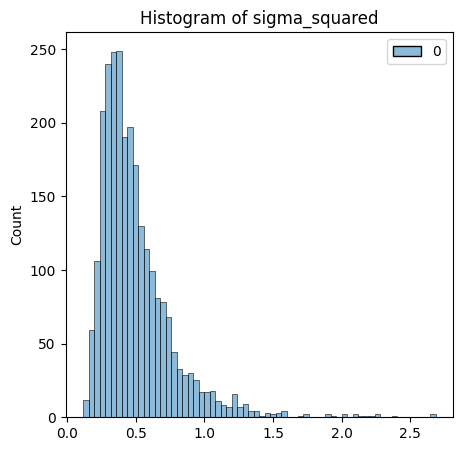

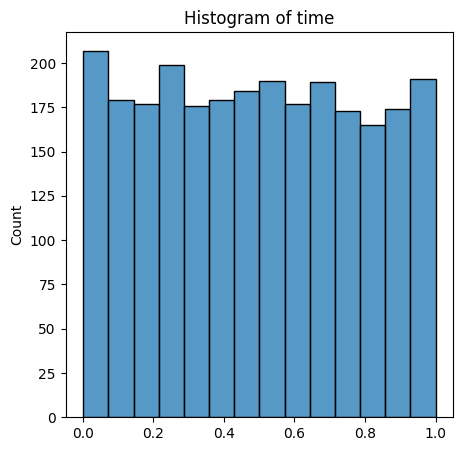

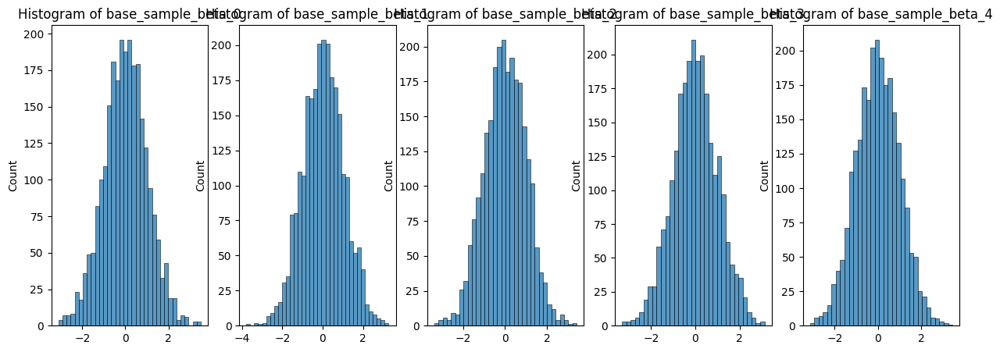

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 73.88it/s]

torch.Size([10000, 5])
{'X': {'mean': tensor(0.5002), 'variance': tensor(0.0833), 'min': tensor(1.0133e-06), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.2581), 'variance': tensor(0.6317), 'min': tensor(-6.1168), 'max': tensor(8.8378)}, 'beta': {'mean': tensor([0.4997, 0.5002, 0.4989, 0.5087, 0.5077]), 'variance': tensor([0.1262, 0.1248, 0.1226, 0.1256, 0.1234]), 'min': tensor([1.0200e-08, 3.9211e-08, 1.3489e-07, 9.3253e-08, 1.0174e-08]), 'max': tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000])}}
Statistics for sigma_squared:
Mean: tensor([0.4931])
Variance: tensor([0.0725])
Min: tensor([0.1254])
Max: tensor([3.1007])


Statistics for time:
Mean: 0.4992542865918949
Variance: 0.0838174039377291
Min: 0.00014162063598632812
Max: 0.9999434947967529


Statistics for base_sample_beta:
Mean: tensor([ 0.0404,  0.0186,  0.0058,  0.0453, -0.0216])
Variance: tensor([1.0277, 0.9690, 1.0135, 1.0539, 1.0087])
Min: tensor([-3.3279, -3.4068, -3.6236, -3.2284, -3.9600])
Max: tensor([4.1261, 3.1664, 3.

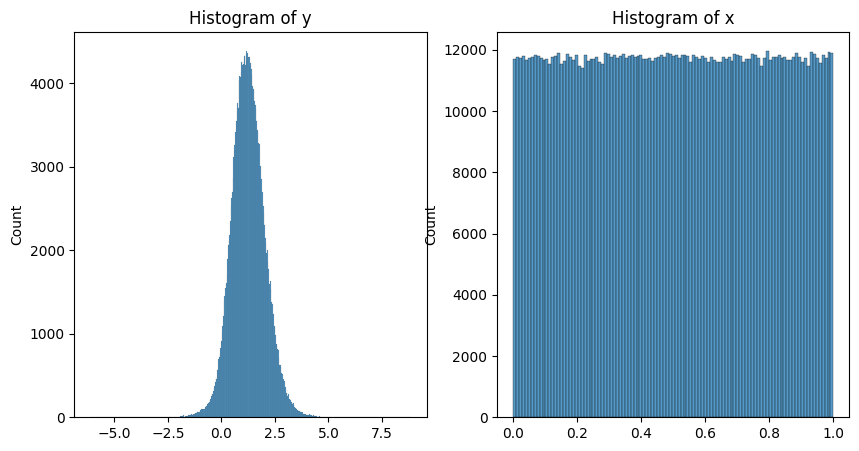

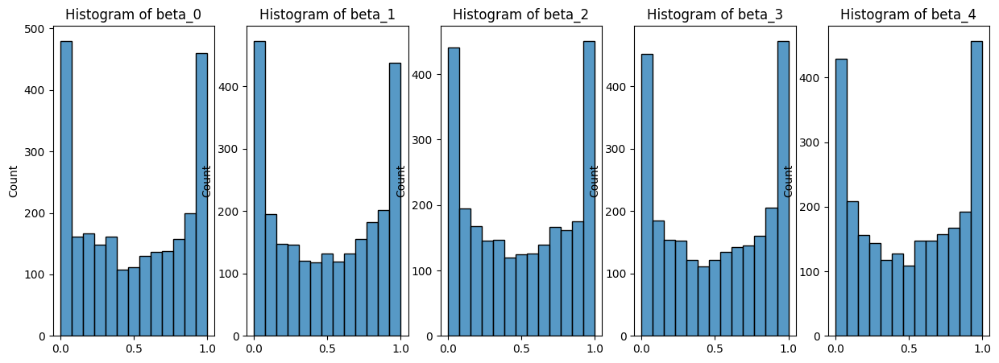

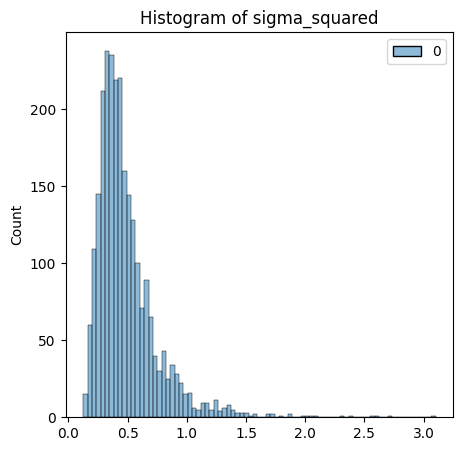

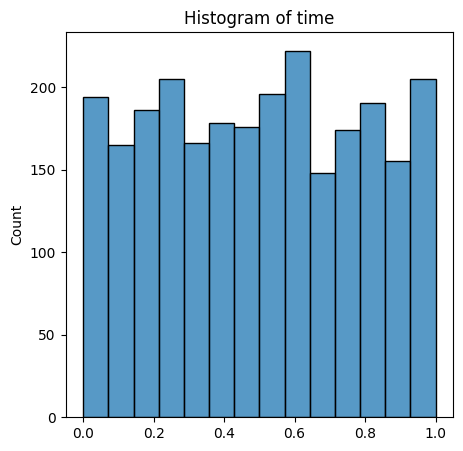

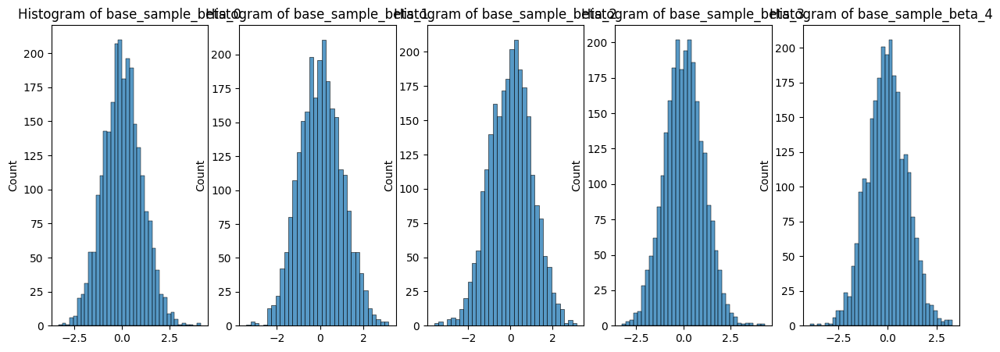

[{'X': {'mean': tensor(0.5003),
   'variance': tensor(0.0834),
   'min': tensor(1.7881e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.2613),
   'variance': tensor(0.6394),
   'min': tensor(-6.1642),
   'max': tensor(8.7874)},
  'beta': {'mean': tensor([0.5034, 0.5093, 0.4969, 0.5150, 0.4966]),
   'variance': tensor([0.1260, 0.1264, 0.1244, 0.1244, 0.1286]),
   'min': tensor([2.4726e-06, 3.7475e-08, 1.5087e-07, 5.6302e-06, 9.2298e-07]),
   'max': tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000])}},
 {'X': {'mean': tensor(0.5002),
   'variance': tensor(0.0833),
   'min': tensor(1.0133e-06),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.2581),
   'variance': tensor(0.6317),
   'min': tensor(-6.1168),
   'max': tensor(8.8378)},
  'beta': {'mean': tensor([0.4997, 0.5002, 0.4989, 0.5087, 0.5077]),
   'variance': tensor([0.1262, 0.1248, 0.1226, 0.1256, 0.1234]),
   'min': tensor([1.0200e-08, 3.9211e-08, 1.3489e-07, 9.3253e-08, 1.0174e-08]),
   'max': tensor([1.0000, 1.0000, 1.

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

torch.Size([1, 10])
(1, 10)


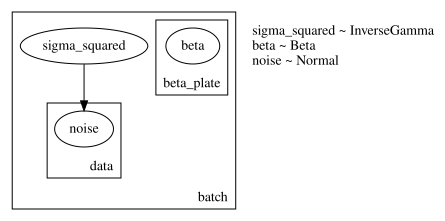

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
#save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [ ]:
model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 384,
    n_heads= 6,
    dim_feedforward=384*2,
    dropout_rate = 0.1,
    n_layers=7,
    n_skip_layers_final_heads = 3,
    n_output_units_per_head=[P, P*P, P]
)

encoder_to_process_encoder_output = torch.nn.TransformerEncoder(
    torch.nn.TransformerEncoderLayer(d_model=encoder.d_model,
                                     nhead=encoder.n_heads,
                                     dim_feedforward = encoder.dim_feedforward,
                                     batch_first = True,
                                     norm_first = True),
    num_layers=4)


#encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples


mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)

model_to_process_encoder_output_for_decoder = TransformerPlusNLP(
    transformer_encoder = encoder_to_process_encoder_output,
    mlp = mlp_to_process_encoder_output
)


mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 4,
    d_ff = 512,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 4,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 512,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
    encoder = encoder,
    model_posterior = model_posterior,
    model_to_process_encoder_output = model_to_process_encoder_output_for_decoder,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)




/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'5.31e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=1e-4,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor= 1e3)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0,
    stop_gradients_from_FM_to_encoder = True
)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_14_09_47_47")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_23_20_04_00'

In [ ]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

Could not load model
[Errno 2] No such file or directory: '/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_23_20_04_00/model.pth'


In [ ]:
trainer.validate()

  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


{'loss_mean': 40.60895538330078,
 'loss_median': 40.599754333496094,
 'loss_std': 0.6267363429069519,
 'loss_FM_mean': 0.44726628065109253,
 'loss_FM_median': 0.44775906205177307,
 'loss_FM_std': 0.004269626457244158,
 'loss_NLL_mean': 80.77064514160156,
 'loss_NLL_median': 80.75708770751953,
 'loss_NLL_std': 1.2513443231582642}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'a': 5.0, 'b': 2.0, 'alpha_betadist': 0.5, 'beta_betadist': 0.5} at iteration 0


  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 0:
Training: {'loss_mean': 9.380387306213379, 'loss_median': 9.472174644470215, 'loss_std': 0.6913376450538635, 'loss_FM_mean': 3.673168420791626, 'loss_FM_median': 3.6124465465545654, 'loss_FM_std': 0.25537264347076416, 'loss_NLL_mean': 15.087606430053711, 'loss_NLL_median': 15.264677047729492, 'loss_NLL_std': 1.323142170906067}
Validation: {'loss_mean': 12.021512985229492, 'loss_median': 5.913477897644043, 'loss_std': 22.371967315673828, 'loss_FM_mean': 14.90886116027832, 'loss_FM_median': 2.723623037338257, 'loss_FM_std': 44.71897506713867, 'loss_NLL_mean': 9.134163856506348, 'loss_NLL_median': 9.119924545288086, 'loss_NLL_std': 0.15300336480140686}
Validation curriculum: {'loss_mean': 36.65985870361328, 'loss_median': 5.765517711639404, 'loss_std': 160.59176635742188, 'loss_FM_mean': 64.22062683105469, 'loss_FM_median': 2.4105966091156006, 'loss_FM_std': 321.17816162109375, 'loss_NLL_mean': 9.099091529846191, 'loss_NLL_median': 9.11275863647461, 'loss_NLL_std': 0.106186762452

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 1:
Training: {'loss_mean': 7.116207122802734, 'loss_median': 7.079471588134766, 'loss_std': 0.5153481364250183, 'loss_FM_mean': 3.6492831707000732, 'loss_FM_median': 3.563913106918335, 'loss_FM_std': 0.41646188497543335, 'loss_NLL_mean': 10.583130836486816, 'loss_NLL_median': 10.482542037963867, 'loss_NLL_std': 1.1504936218261719}
Validation: {'loss_mean': 35.78136444091797, 'loss_median': 5.503294944763184, 'loss_std': 111.25542449951172, 'loss_FM_mean': 64.9405517578125, 'loss_FM_median': 4.225501537322998, 'loss_FM_std': 222.5133514404297, 'loss_NLL_mean': 6.6221818923950195, 'loss_NLL_median': 6.642060279846191, 'loss_NLL_std': 0.12559515237808228}
Validation curriculum: {'loss_mean': 58.6650390625, 'loss_median': 5.732958793640137, 'loss_std': 187.13121032714844, 'loss_FM_mean': 110.70256805419922, 'loss_FM_median': 4.853028774261475, 'loss_FM_std': 374.2471923828125, 'loss_NLL_mean': 6.627518177032471, 'loss_NLL_median': 6.608400344848633, 'loss_NLL_std': 0.1296978592872619

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 2:
Training: {'loss_mean': 6.601293563842773, 'loss_median': 6.511239051818848, 'loss_std': 0.46774744987487793, 'loss_FM_mean': 6.072269439697266, 'loss_FM_median': 5.865484237670898, 'loss_FM_std': 1.546839952468872, 'loss_NLL_mean': 7.130317211151123, 'loss_NLL_median': 7.139086723327637, 'loss_NLL_std': 1.012264370918274}
Validation: {'loss_mean': 7.811014652252197, 'loss_median': 7.755776882171631, 'loss_std': 1.5430413484573364, 'loss_FM_mean': 10.981575012207031, 'loss_FM_median': 10.772480964660645, 'loss_FM_std': 2.9879355430603027, 'loss_NLL_mean': 4.640452861785889, 'loss_NLL_median': 4.62917423248291, 'loss_NLL_std': 0.15441857278347015}
Validation curriculum: {'loss_mean': 8.184287071228027, 'loss_median': 8.056754112243652, 'loss_std': 1.352579116821289, 'loss_FM_mean': 11.695568084716797, 'loss_FM_median': 11.546978950500488, 'loss_FM_std': 2.584721326828003, 'loss_NLL_mean': 4.6730055809021, 'loss_NLL_median': 4.650986671447754, 'loss_NLL_std': 0.15961530804634094

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 3:
Training: {'loss_mean': 8.561022758483887, 'loss_median': 8.41102409362793, 'loss_std': 1.1188881397247314, 'loss_FM_mean': 12.236268997192383, 'loss_FM_median': 12.1414155960083, 'loss_FM_std': 2.3337972164154053, 'loss_NLL_mean': 4.885776042938232, 'loss_NLL_median': 4.760251998901367, 'loss_NLL_std': 0.5175254344940186}
Validation: {'loss_mean': 13.671481132507324, 'loss_median': 13.680867195129395, 'loss_std': 3.887087345123291, 'loss_FM_mean': 23.349082946777344, 'loss_FM_median': 23.331945419311523, 'loss_FM_std': 7.561731338500977, 'loss_NLL_mean': 3.993879556655884, 'loss_NLL_median': 3.9994516372680664, 'loss_NLL_std': 0.2533525824546814}
Validation curriculum: {'loss_mean': 14.747462272644043, 'loss_median': 14.770225524902344, 'loss_std': 4.509354591369629, 'loss_FM_mean': 25.474788665771484, 'loss_FM_median': 25.532251358032227, 'loss_FM_std': 8.90043830871582, 'loss_NLL_mean': 4.020133972167969, 'loss_NLL_median': 4.0081987380981445, 'loss_NLL_std': 0.204490318894

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 4:
Training: {'loss_mean': 10.977848052978516, 'loss_median': 10.682412147521973, 'loss_std': 1.6680073738098145, 'loss_FM_mean': 17.520936965942383, 'loss_FM_median': 16.944202423095703, 'loss_FM_std': 3.2042834758758545, 'loss_NLL_mean': 4.434761047363281, 'loss_NLL_median': 4.187315940856934, 'loss_NLL_std': 0.707204282283783}
Validation: {'loss_mean': 13.238903999328613, 'loss_median': 13.011212348937988, 'loss_std': 3.533277750015259, 'loss_FM_mean': 23.14774513244629, 'loss_FM_median': 22.637544631958008, 'loss_FM_std': 6.995813369750977, 'loss_NLL_mean': 3.3300628662109375, 'loss_NLL_median': 3.315546989440918, 'loss_NLL_std': 0.1324203461408615}
Validation curriculum: {'loss_mean': 14.336234092712402, 'loss_median': 11.861929893493652, 'loss_std': 5.981933116912842, 'loss_FM_mean': 25.370370864868164, 'loss_FM_median': 20.517011642456055, 'loss_FM_std': 11.908445358276367, 'loss_NLL_mean': 3.302095413208008, 'loss_NLL_median': 3.278240442276001, 'loss_NLL_std': 0.13780686

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 5:
Training: {'loss_mean': 11.084771156311035, 'loss_median': 10.711935043334961, 'loss_std': 2.264892101287842, 'loss_FM_mean': 17.97876739501953, 'loss_FM_median': 17.420398712158203, 'loss_FM_std': 4.100146770477295, 'loss_NLL_mean': 4.190776824951172, 'loss_NLL_median': 3.9056551456451416, 'loss_NLL_std': 1.013907790184021}
Validation: {'loss_mean': 21.01567268371582, 'loss_median': 12.033958435058594, 'loss_std': 61.686012268066406, 'loss_FM_mean': 38.822444915771484, 'loss_FM_median': 20.81159782409668, 'loss_FM_std': 123.40144348144531, 'loss_NLL_mean': 3.208900213241577, 'loss_NLL_median': 3.1895551681518555, 'loss_NLL_std': 0.16257205605506897}
Validation curriculum: {'loss_mean': 11.381608009338379, 'loss_median': 11.034107208251953, 'loss_std': 3.551699161529541, 'loss_FM_mean': 19.571191787719727, 'loss_FM_median': 18.958160400390625, 'loss_FM_std': 7.006283760070801, 'loss_NLL_mean': 3.1920268535614014, 'loss_NLL_median': 3.197838544845581, 'loss_NLL_std': 0.14504334

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 6:
Training: {'loss_mean': 9.934962272644043, 'loss_median': 9.260430335998535, 'loss_std': 2.419048309326172, 'loss_FM_mean': 15.960105895996094, 'loss_FM_median': 15.014862060546875, 'loss_FM_std': 4.18818473815918, 'loss_NLL_mean': 3.909818172454834, 'loss_NLL_median': 3.4821441173553467, 'loss_NLL_std': 1.1876994371414185}
Validation: {'loss_mean': 8.658926963806152, 'loss_median': 8.48466682434082, 'loss_std': 3.1377298831939697, 'loss_FM_mean': 14.489424705505371, 'loss_FM_median': 14.2251615524292, 'loss_FM_std': 6.20296573638916, 'loss_NLL_mean': 2.828429937362671, 'loss_NLL_median': 2.8284735679626465, 'loss_NLL_std': 0.12341764569282532}
Validation curriculum: {'loss_mean': 9.114579200744629, 'loss_median': 8.335466384887695, 'loss_std': 3.3863158226013184, 'loss_FM_mean': 15.373172760009766, 'loss_FM_median': 13.751082420349121, 'loss_FM_std': 6.67647647857666, 'loss_NLL_mean': 2.8559865951538086, 'loss_NLL_median': 2.8884682655334473, 'loss_NLL_std': 0.133400753140449

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 7:
Training: {'loss_mean': 8.065591812133789, 'loss_median': 7.589592933654785, 'loss_std': 1.9521198272705078, 'loss_FM_mean': 13.258639335632324, 'loss_FM_median': 12.564860343933105, 'loss_FM_std': 3.454481363296509, 'loss_NLL_mean': 2.872544527053833, 'loss_NLL_median': 2.6220216751098633, 'loss_NLL_std': 1.1720203161239624}
Validation: {'loss_mean': 8.543462753295898, 'loss_median': 8.176946640014648, 'loss_std': 2.3779447078704834, 'loss_FM_mean': 16.104976654052734, 'loss_FM_median': 15.4234037399292, 'loss_FM_std': 4.65483283996582, 'loss_NLL_mean': 0.9819473624229431, 'loss_NLL_median': 0.9837784767150879, 'loss_NLL_std': 0.14568530023097992}
Validation curriculum: {'loss_mean': 8.5845365524292, 'loss_median': 8.481600761413574, 'loss_std': 2.937671661376953, 'loss_FM_mean': 16.207944869995117, 'loss_FM_median': 15.823119163513184, 'loss_FM_std': 5.756882190704346, 'loss_NLL_mean': 0.9611281752586365, 'loss_NLL_median': 0.9500196576118469, 'loss_NLL_std': 0.1670362353324

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 8:
Training: {'loss_mean': 6.432089805603027, 'loss_median': 6.280004024505615, 'loss_std': 1.8382385969161987, 'loss_FM_mean': 11.353236198425293, 'loss_FM_median': 10.845403671264648, 'loss_FM_std': 3.3128280639648438, 'loss_NLL_mean': 1.5109434127807617, 'loss_NLL_median': 1.320847749710083, 'loss_NLL_std': 1.1449037790298462}
Validation: {'loss_mean': 5.81936502456665, 'loss_median': 5.396172046661377, 'loss_std': 2.1833133697509766, 'loss_FM_mean': 11.080093383789062, 'loss_FM_median': 10.288482666015625, 'loss_FM_std': 4.293598175048828, 'loss_NLL_mean': 0.5586369633674622, 'loss_NLL_median': 0.5319086313247681, 'loss_NLL_std': 0.1356928050518036}
Validation curriculum: {'loss_mean': 6.51393461227417, 'loss_median': 5.953804969787598, 'loss_std': 2.610114574432373, 'loss_FM_mean': 12.496294021606445, 'loss_FM_median': 11.516691207885742, 'loss_FM_std': 5.109269618988037, 'loss_NLL_mean': 0.5315752625465393, 'loss_NLL_median': 0.5044101476669312, 'loss_NLL_std': 0.1640534251

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 9:
Training: {'loss_mean': 3.6818270683288574, 'loss_median': 3.5433731079101562, 'loss_std': 1.5355623960494995, 'loss_FM_mean': 7.262163162231445, 'loss_FM_median': 6.932140350341797, 'loss_FM_std': 2.6864447593688965, 'loss_NLL_mean': 0.10149098932743073, 'loss_NLL_median': -0.1304192990064621, 'loss_NLL_std': 1.0422183275222778}
Validation: {'loss_mean': 2.9694302082061768, 'loss_median': 2.725785732269287, 'loss_std': 1.2898067235946655, 'loss_FM_mean': 7.762441158294678, 'loss_FM_median': 7.190158367156982, 'loss_FM_std': 2.4865942001342773, 'loss_NLL_mean': -1.823581576347351, 'loss_NLL_median': -1.8473231792449951, 'loss_NLL_std': 0.16466905176639557}
Validation curriculum: {'loss_mean': 2.9708871841430664, 'loss_median': 2.9314122200012207, 'loss_std': 1.4673107862472534, 'loss_FM_mean': 7.767848968505859, 'loss_FM_median': 7.669325351715088, 'loss_FM_std': 2.842395067214966, 'loss_NLL_mean': -1.8260753154754639, 'loss_NLL_median': -1.8397623300552368, 'loss_NLL_std': 0.

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 10:
Training: {'loss_mean': 1.8646442890167236, 'loss_median': 1.5833073854446411, 'loss_std': 1.1796274185180664, 'loss_FM_mean': 4.489741802215576, 'loss_FM_median': 4.010760307312012, 'loss_FM_std': 1.7846554517745972, 'loss_NLL_mean': -0.7604528665542603, 'loss_NLL_median': -1.157637596130371, 'loss_NLL_std': 1.2706599235534668}
Validation: {'loss_mean': 0.35369110107421875, 'loss_median': 0.15176498889923096, 'loss_std': 0.8333056569099426, 'loss_FM_mean': 3.5785274505615234, 'loss_FM_median': 3.1888515949249268, 'loss_FM_std': 1.5871225595474243, 'loss_NLL_mean': -2.8711447715759277, 'loss_NLL_median': -2.859466075897217, 'loss_NLL_std': 0.14684100449085236}
Validation curriculum: {'loss_mean': 0.4559975564479828, 'loss_median': 0.26991307735443115, 'loss_std': 0.8928220272064209, 'loss_FM_mean': 3.7347521781921387, 'loss_FM_median': 3.38847017288208, 'loss_FM_std': 1.7239950895309448, 'loss_NLL_mean': -2.8227570056915283, 'loss_NLL_median': -2.851273536682129, 'loss_NLL_st

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 11:
Training: {'loss_mean': 0.67914217710495, 'loss_median': 0.5364562273025513, 'loss_std': 0.9734218716621399, 'loss_FM_mean': 3.105391025543213, 'loss_FM_median': 2.8521106243133545, 'loss_FM_std': 1.4151015281677246, 'loss_NLL_mean': -1.7471065521240234, 'loss_NLL_median': -2.01939058303833, 'loss_NLL_std': 1.0906720161437988}
Validation: {'loss_mean': -0.29839837551116943, 'loss_median': -0.358192503452301, 'loss_std': 0.38479384779930115, 'loss_FM_mean': 1.5014216899871826, 'loss_FM_median': 1.3166983127593994, 'loss_FM_std': 0.6870944499969482, 'loss_NLL_mean': -2.0982184410095215, 'loss_NLL_median': -2.132995128631592, 'loss_NLL_std': 0.15510694682598114}
Validation curriculum: {'loss_mean': -0.20292124152183533, 'loss_median': -0.29645997285842896, 'loss_std': 0.6257115602493286, 'loss_FM_mean': 1.6815649271011353, 'loss_FM_median': 1.4117777347564697, 'loss_FM_std': 1.1881067752838135, 'loss_NLL_mean': -2.0874075889587402, 'loss_NLL_median': -2.097322463989258, 'loss_NL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 12:
Training: {'loss_mean': 0.15842394530773163, 'loss_median': -0.05291140079498291, 'loss_std': 0.7637498378753662, 'loss_FM_mean': 2.4829952716827393, 'loss_FM_median': 2.225595235824585, 'loss_FM_std': 0.9610377550125122, 'loss_NLL_mean': -2.166147232055664, 'loss_NLL_median': -2.4530625343322754, 'loss_NLL_std': 1.072786808013916}
Validation: {'loss_mean': 0.7290489077568054, 'loss_median': 0.43222618103027344, 'loss_std': 1.2464417219161987, 'loss_FM_mean': 4.9762282371521, 'loss_FM_median': 4.440401554107666, 'loss_FM_std': 2.461329936981201, 'loss_NLL_mean': -3.5181307792663574, 'loss_NLL_median': -3.5042152404785156, 'loss_NLL_std': 0.11523769050836563}
Validation curriculum: {'loss_mean': 1.2956732511520386, 'loss_median': 0.9627457857131958, 'loss_std': 1.775090217590332, 'loss_FM_mean': 6.063165187835693, 'loss_FM_median': 5.5575175285339355, 'loss_FM_std': 3.490374803543091, 'loss_NLL_mean': -3.4718191623687744, 'loss_NLL_median': -3.461393356323242, 'loss_NLL_std': 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 13:
Training: {'loss_mean': 0.18306328356266022, 'loss_median': -0.1094086766242981, 'loss_std': 0.9277927875518799, 'loss_FM_mean': 2.708855628967285, 'loss_FM_median': 2.468881368637085, 'loss_FM_std': 1.1855013370513916, 'loss_NLL_mean': -2.342728853225708, 'loss_NLL_median': -2.7423202991485596, 'loss_NLL_std': 1.368874192237854}
Validation: {'loss_mean': -1.2034155130386353, 'loss_median': -1.2390482425689697, 'loss_std': 0.4483712911605835, 'loss_FM_mean': 1.5163284540176392, 'loss_FM_median': 1.4185367822647095, 'loss_FM_std': 0.8619512915611267, 'loss_NLL_mean': -3.923159599304199, 'loss_NLL_median': -3.918830394744873, 'loss_NLL_std': 0.144271120429039}
Validation curriculum: {'loss_mean': -1.2219324111938477, 'loss_median': -1.3611745834350586, 'loss_std': 0.4744625389575958, 'loss_FM_mean': 1.4573659896850586, 'loss_FM_median': 1.1941322088241577, 'loss_FM_std': 0.8701871037483215, 'loss_NLL_mean': -3.901230573654175, 'loss_NLL_median': -3.876988172531128, 'loss_NLL_st

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 14:
Training: {'loss_mean': -0.09472635388374329, 'loss_median': -0.37420332431793213, 'loss_std': 1.0364673137664795, 'loss_FM_mean': 2.4730119705200195, 'loss_FM_median': 2.066673994064331, 'loss_FM_std': 1.5678497552871704, 'loss_NLL_mean': -2.6624648571014404, 'loss_NLL_median': -3.061436176300049, 'loss_NLL_std': 1.219891905784607}
Validation: {'loss_mean': 3.193881034851074, 'loss_median': 2.0564382076263428, 'loss_std': 3.6666409969329834, 'loss_FM_mean': 10.409807205200195, 'loss_FM_median': 7.926065921783447, 'loss_FM_std': 7.336536407470703, 'loss_NLL_mean': -4.022045612335205, 'loss_NLL_median': -4.043827533721924, 'loss_NLL_std': 0.1371927261352539}
Validation curriculum: {'loss_mean': 2.7998385429382324, 'loss_median': 2.1960325241088867, 'loss_std': 3.5743350982666016, 'loss_FM_mean': 9.64322566986084, 'loss_FM_median': 8.603072166442871, 'loss_FM_std': 7.045607566833496, 'loss_NLL_mean': -4.043548107147217, 'loss_NLL_median': -4.056201457977295, 'loss_NLL_std': 0.1

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 15:
Training: {'loss_mean': -0.11859405040740967, 'loss_median': -0.5931046009063721, 'loss_std': 1.511007308959961, 'loss_FM_mean': 2.3187661170959473, 'loss_FM_median': 1.9420617818832397, 'loss_FM_std': 1.3944560289382935, 'loss_NLL_mean': -2.5559539794921875, 'loss_NLL_median': -3.192446708679199, 'loss_NLL_std': 2.2422451972961426}
Validation: {'loss_mean': -1.5802900791168213, 'loss_median': -1.6702667474746704, 'loss_std': 0.5002526044845581, 'loss_FM_mean': 1.4718027114868164, 'loss_FM_median': 1.2047576904296875, 'loss_FM_std': 0.9620039463043213, 'loss_NLL_mean': -4.632382392883301, 'loss_NLL_median': -4.642385005950928, 'loss_NLL_std': 0.14395573735237122}
Validation curriculum: {'loss_mean': -1.6740217208862305, 'loss_median': -1.7514240741729736, 'loss_std': 0.4584348499774933, 'loss_FM_mean': 1.353329062461853, 'loss_FM_median': 1.1684128046035767, 'loss_FM_std': 0.8240662217140198, 'loss_NLL_mean': -4.7013726234436035, 'loss_NLL_median': -4.746181964874268, 'loss_N

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 16:
Training: {'loss_mean': -0.5004570484161377, 'loss_median': -0.8448017239570618, 'loss_std': 1.257611632347107, 'loss_FM_mean': 1.99172043800354, 'loss_FM_median': 1.5511046648025513, 'loss_FM_std': 1.4107670783996582, 'loss_NLL_mean': -2.9926342964172363, 'loss_NLL_median': -3.4967153072357178, 'loss_NLL_std': 1.9924687147140503}
Validation: {'loss_mean': -1.2753149271011353, 'loss_median': -1.6179752349853516, 'loss_std': 0.9756985902786255, 'loss_FM_mean': 1.8249008655548096, 'loss_FM_median': 1.1582955121994019, 'loss_FM_std': 1.9097628593444824, 'loss_NLL_mean': -4.37553071975708, 'loss_NLL_median': -4.356810569763184, 'loss_NLL_std': 0.18342280387878418}
Validation curriculum: {'loss_mean': -1.226393699645996, 'loss_median': -1.450129747390747, 'loss_std': 0.7213347554206848, 'loss_FM_mean': 1.8975895643234253, 'loss_FM_median': 1.5427792072296143, 'loss_FM_std': 1.4003455638885498, 'loss_NLL_mean': -4.350377082824707, 'loss_NLL_median': -4.334481239318848, 'loss_NLL_st

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 17:
Training: {'loss_mean': -0.9376682043075562, 'loss_median': -1.1934891939163208, 'loss_std': 1.2006216049194336, 'loss_FM_mean': 1.5798251628875732, 'loss_FM_median': 1.303775668144226, 'loss_FM_std': 0.9418771862983704, 'loss_NLL_mean': -3.4551610946655273, 'loss_NLL_median': -3.975153923034668, 'loss_NLL_std': 1.9287089109420776}
Validation: {'loss_mean': -2.2198338508605957, 'loss_median': -2.2295167446136475, 'loss_std': 0.1302311271429062, 'loss_FM_mean': 0.29564183950424194, 'loss_FM_median': 0.27931198477745056, 'loss_FM_std': 0.19845177233219147, 'loss_NLL_mean': -4.735309600830078, 'loss_NLL_median': -4.741581916809082, 'loss_NLL_std': 0.11908598244190216}
Validation curriculum: {'loss_mean': -2.1547462940216064, 'loss_median': -2.212632417678833, 'loss_std': 0.28443706035614014, 'loss_FM_mean': 0.3929833471775055, 'loss_FM_median': 0.2807178199291229, 'loss_FM_std': 0.5115616917610168, 'loss_NLL_mean': -4.7024760246276855, 'loss_NLL_median': -4.689645767211914, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 18:
Training: {'loss_mean': -1.3146588802337646, 'loss_median': -1.529621958732605, 'loss_std': 0.9756090641021729, 'loss_FM_mean': 1.1920281648635864, 'loss_FM_median': 1.0516074895858765, 'loss_FM_std': 0.5813210606575012, 'loss_NLL_mean': -3.8213460445404053, 'loss_NLL_median': -4.22761344909668, 'loss_NLL_std': 1.7002670764923096}
Validation: {'loss_mean': -2.5418968200683594, 'loss_median': -2.5868566036224365, 'loss_std': 0.15792988240718842, 'loss_FM_mean': 0.39195147156715393, 'loss_FM_median': 0.335660457611084, 'loss_FM_std': 0.2569316625595093, 'loss_NLL_mean': -5.475744724273682, 'loss_NLL_median': -5.47405481338501, 'loss_NLL_std': 0.10561568289995193}
Validation curriculum: {'loss_mean': -2.5674428939819336, 'loss_median': -2.583632469177246, 'loss_std': 0.1510741412639618, 'loss_FM_mean': 0.33756425976753235, 'loss_FM_median': 0.27510419487953186, 'loss_FM_std': 0.24862618744373322, 'loss_NLL_mean': -5.47244930267334, 'loss_NLL_median': -5.472247123718262, 'loss_NL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 19:
Training: {'loss_mean': -1.4646790027618408, 'loss_median': -1.7012383937835693, 'loss_std': 0.9225137829780579, 'loss_FM_mean': 1.0665091276168823, 'loss_FM_median': 0.9317952394485474, 'loss_FM_std': 0.5537132024765015, 'loss_NLL_mean': -3.9958672523498535, 'loss_NLL_median': -4.517886638641357, 'loss_NLL_std': 1.649105429649353}
Validation: {'loss_mean': -2.8398354053497314, 'loss_median': -2.860238790512085, 'loss_std': 0.10904022306203842, 'loss_FM_mean': 0.18160714209079742, 'loss_FM_median': 0.14031825959682465, 'loss_FM_std': 0.15703895688056946, 'loss_NLL_mean': -5.8612775802612305, 'loss_NLL_median': -5.883894920349121, 'loss_NLL_std': 0.11992794275283813}
Validation curriculum: {'loss_mean': -2.8127200603485107, 'loss_median': -2.8348703384399414, 'loss_std': 0.11825346946716309, 'loss_FM_mean': 0.22289541363716125, 'loss_FM_median': 0.13325200974941254, 'loss_FM_std': 0.2155420333147049, 'loss_NLL_mean': -5.8483357429504395, 'loss_NLL_median': -5.828975677490234, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 20:
Training: {'loss_mean': -1.6985920667648315, 'loss_median': -1.9776005744934082, 'loss_std': 1.0570504665374756, 'loss_FM_mean': 0.9073720574378967, 'loss_FM_median': 0.788284957408905, 'loss_FM_std': 0.5544205904006958, 'loss_NLL_mean': -4.304556369781494, 'loss_NLL_median': -4.790718078613281, 'loss_NLL_std': 1.8850300312042236}
Validation: {'loss_mean': -2.699995756149292, 'loss_median': -2.7244553565979004, 'loss_std': 0.1686035841703415, 'loss_FM_mean': 0.30096912384033203, 'loss_FM_median': 0.22411060333251953, 'loss_FM_std': 0.26619553565979004, 'loss_NLL_mean': -5.700960636138916, 'loss_NLL_median': -5.703176498413086, 'loss_NLL_std': 0.12266561388969421}
Validation curriculum: {'loss_mean': -2.7033255100250244, 'loss_median': -2.7225048542022705, 'loss_std': 0.13137081265449524, 'loss_FM_mean': 0.26020675897598267, 'loss_FM_median': 0.22212933003902435, 'loss_FM_std': 0.1718093901872635, 'loss_NLL_mean': -5.666858196258545, 'loss_NLL_median': -5.66093635559082, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 21:
Training: {'loss_mean': -1.8312112092971802, 'loss_median': -2.120145559310913, 'loss_std': 0.9662037491798401, 'loss_FM_mean': 0.7148957252502441, 'loss_FM_median': 0.6640343070030212, 'loss_FM_std': 0.2658874988555908, 'loss_NLL_mean': -4.377318859100342, 'loss_NLL_median': -4.957065105438232, 'loss_NLL_std': 1.8648046255111694}
Validation: {'loss_mean': -2.481846332550049, 'loss_median': -2.6859583854675293, 'loss_std': 0.7010495066642761, 'loss_FM_mean': 0.7464401125907898, 'loss_FM_median': 0.3096865117549896, 'loss_FM_std': 1.376469612121582, 'loss_NLL_mean': -5.710132598876953, 'loss_NLL_median': -5.698525428771973, 'loss_NLL_std': 0.1279374063014984}
Validation curriculum: {'loss_mean': -2.6255910396575928, 'loss_median': -2.7108843326568604, 'loss_std': 0.25557318329811096, 'loss_FM_mean': 0.4649490416049957, 'loss_FM_median': 0.29778853058815, 'loss_FM_std': 0.4615769386291504, 'loss_NLL_mean': -5.716131687164307, 'loss_NLL_median': -5.7565016746521, 'loss_NLL_std':

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 22:
Training: {'loss_mean': -2.130115270614624, 'loss_median': -2.263608455657959, 'loss_std': 0.5974112749099731, 'loss_FM_mean': 0.5815540552139282, 'loss_FM_median': 0.5328404307365417, 'loss_FM_std': 0.20478296279907227, 'loss_NLL_mean': -4.8417840003967285, 'loss_NLL_median': -5.113729476928711, 'loss_NLL_std': 1.1431185007095337}
Validation: {'loss_mean': -2.345473051071167, 'loss_median': -2.346665859222412, 'loss_std': 0.10890433937311172, 'loss_FM_mean': 0.31594064831733704, 'loss_FM_median': 0.28185805678367615, 'loss_FM_std': 0.14089126884937286, 'loss_NLL_mean': -5.0068864822387695, 'loss_NLL_median': -5.021125793457031, 'loss_NLL_std': 0.13126854598522186}
Validation curriculum: {'loss_mean': -2.3300201892852783, 'loss_median': -2.3483083248138428, 'loss_std': 0.12615150213241577, 'loss_FM_mean': 0.31435123085975647, 'loss_FM_median': 0.28220123052597046, 'loss_FM_std': 0.15312018990516663, 'loss_NLL_mean': -4.974391937255859, 'loss_NLL_median': -4.97493839263916, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 23:
Training: {'loss_mean': -2.2677743434906006, 'loss_median': -2.4124703407287598, 'loss_std': 0.6026490926742554, 'loss_FM_mean': 0.5158107280731201, 'loss_FM_median': 0.47666260600090027, 'loss_FM_std': 0.16959941387176514, 'loss_NLL_mean': -5.051359176635742, 'loss_NLL_median': -5.321641445159912, 'loss_NLL_std': 1.1733092069625854}
Validation: {'loss_mean': -2.981839656829834, 'loss_median': -2.9763267040252686, 'loss_std': 0.09928151965141296, 'loss_FM_mean': 0.3142130672931671, 'loss_FM_median': 0.31512102484703064, 'loss_FM_std': 0.10134942084550858, 'loss_NLL_mean': -6.27789306640625, 'loss_NLL_median': -6.291579246520996, 'loss_NLL_std': 0.14796705543994904}
Validation curriculum: {'loss_mean': -2.959963321685791, 'loss_median': -2.9666941165924072, 'loss_std': 0.10085044801235199, 'loss_FM_mean': 0.2975286841392517, 'loss_FM_median': 0.2931966781616211, 'loss_FM_std': 0.09558030217885971, 'loss_NLL_mean': -6.217454433441162, 'loss_NLL_median': -6.233787536621094, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 24:
Training: {'loss_mean': -2.4248099327087402, 'loss_median': -2.5545406341552734, 'loss_std': 0.7370478510856628, 'loss_FM_mean': 0.49053364992141724, 'loss_FM_median': 0.47362279891967773, 'loss_FM_std': 0.13238738477230072, 'loss_NLL_mean': -5.340153694152832, 'loss_NLL_median': -5.606550216674805, 'loss_NLL_std': 1.4300103187561035}
Validation: {'loss_mean': -3.1676595211029053, 'loss_median': -3.1542184352874756, 'loss_std': 0.11030744761228561, 'loss_FM_mean': 0.3289434015750885, 'loss_FM_median': 0.2981730103492737, 'loss_FM_std': 0.14492040872573853, 'loss_NLL_mean': -6.664262294769287, 'loss_NLL_median': -6.667524337768555, 'loss_NLL_std': 0.13413335382938385}
Validation curriculum: {'loss_mean': -3.2112905979156494, 'loss_median': -3.225839138031006, 'loss_std': 0.12640726566314697, 'loss_FM_mean': 0.28475508093833923, 'loss_FM_median': 0.23490138351917267, 'loss_FM_std': 0.15737326443195343, 'loss_NLL_mean': -6.707336902618408, 'loss_NLL_median': -6.693999290466309, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 25:
Training: {'loss_mean': -2.5631299018859863, 'loss_median': -2.6855790615081787, 'loss_std': 0.7160581350326538, 'loss_FM_mean': 0.4500913918018341, 'loss_FM_median': 0.42190638184547424, 'loss_FM_std': 0.14239121973514557, 'loss_NLL_mean': -5.576350212097168, 'loss_NLL_median': -5.7962646484375, 'loss_NLL_std': 1.3825043439865112}
Validation: {'loss_mean': -3.475245237350464, 'loss_median': -3.47725248336792, 'loss_std': 0.06666966527700424, 'loss_FM_mean': 0.07471463084220886, 'loss_FM_median': 0.06871257722377777, 'loss_FM_std': 0.026594290509819984, 'loss_NLL_mean': -7.025205135345459, 'loss_NLL_median': -7.022616863250732, 'loss_NLL_std': 0.11825871467590332}
Validation curriculum: {'loss_mean': -3.4883487224578857, 'loss_median': -3.48531436920166, 'loss_std': 0.07753285765647888, 'loss_FM_mean': 0.0808662548661232, 'loss_FM_median': 0.07930128276348114, 'loss_FM_std': 0.02577737346291542, 'loss_NLL_mean': -7.0575642585754395, 'loss_NLL_median': -7.0494232177734375, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 26:
Training: {'loss_mean': -2.5102336406707764, 'loss_median': -2.7025644779205322, 'loss_std': 0.865502655506134, 'loss_FM_mean': 0.4357345998287201, 'loss_FM_median': 0.4045284390449524, 'loss_FM_std': 0.1445072889328003, 'loss_NLL_mean': -5.456201553344727, 'loss_NLL_median': -5.856414318084717, 'loss_NLL_std': 1.7048301696777344}
Validation: {'loss_mean': -2.9719419479370117, 'loss_median': -2.9695019721984863, 'loss_std': 0.10706951469182968, 'loss_FM_mean': 0.23074091970920563, 'loss_FM_median': 0.22530518472194672, 'loss_FM_std': 0.09503545612096786, 'loss_NLL_mean': -6.174623966217041, 'loss_NLL_median': -6.178542137145996, 'loss_NLL_std': 0.15538810193538666}
Validation curriculum: {'loss_mean': -3.00960111618042, 'loss_median': -3.004582405090332, 'loss_std': 0.1072433665394783, 'loss_FM_mean': 0.2208317220211029, 'loss_FM_median': 0.1946462094783783, 'loss_FM_std': 0.09307972341775894, 'loss_NLL_mean': -6.240034580230713, 'loss_NLL_median': -6.240806579589844, 'loss_N

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 27:
Training: {'loss_mean': -2.7195210456848145, 'loss_median': -2.8023128509521484, 'loss_std': 0.48654866218566895, 'loss_FM_mean': 0.39390623569488525, 'loss_FM_median': 0.3731025159358978, 'loss_FM_std': 0.11218973994255066, 'loss_NLL_mean': -5.832947731018066, 'loss_NLL_median': -5.993875503540039, 'loss_NLL_std': 0.9576134085655212}
Validation: {'loss_mean': -3.31614351272583, 'loss_median': -3.3160488605499268, 'loss_std': 0.08199752867221832, 'loss_FM_mean': 0.1186702772974968, 'loss_FM_median': 0.11502279341220856, 'loss_FM_std': 0.040983375161886215, 'loss_NLL_mean': -6.750957489013672, 'loss_NLL_median': -6.754804611206055, 'loss_NLL_std': 0.13977769017219543}
Validation curriculum: {'loss_mean': -3.2951438426971436, 'loss_median': -3.290304183959961, 'loss_std': 0.08527369797229767, 'loss_FM_mean': 0.12197239696979523, 'loss_FM_median': 0.10503506660461426, 'loss_FM_std': 0.05140666663646698, 'loss_NLL_mean': -6.7122602462768555, 'loss_NLL_median': -6.7182111740112305

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 28:
Training: {'loss_mean': -2.727975845336914, 'loss_median': -2.845597505569458, 'loss_std': 0.5755692720413208, 'loss_FM_mean': 0.39597997069358826, 'loss_FM_median': 0.3813634514808655, 'loss_FM_std': 0.12512613832950592, 'loss_NLL_mean': -5.851932048797607, 'loss_NLL_median': -6.068050861358643, 'loss_NLL_std': 1.130743384361267}
Validation: {'loss_mean': -3.3753044605255127, 'loss_median': -3.3915340900421143, 'loss_std': 0.10129381716251373, 'loss_FM_mean': 0.15703217685222626, 'loss_FM_median': 0.14816319942474365, 'loss_FM_std': 0.05666621774435043, 'loss_NLL_mean': -6.907641410827637, 'loss_NLL_median': -6.911020278930664, 'loss_NLL_std': 0.17145997285842896}
Validation curriculum: {'loss_mean': -3.403010129928589, 'loss_median': -3.415889263153076, 'loss_std': 0.0767132043838501, 'loss_FM_mean': 0.15137816965579987, 'loss_FM_median': 0.1422959864139557, 'loss_FM_std': 0.05591031163930893, 'loss_NLL_mean': -6.957397937774658, 'loss_NLL_median': -6.967642784118652, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 29:
Training: {'loss_mean': -2.8187243938446045, 'loss_median': -2.8987274169921875, 'loss_std': 0.5674792528152466, 'loss_FM_mean': 0.39487913250923157, 'loss_FM_median': 0.375880628824234, 'loss_FM_std': 0.12062185257673264, 'loss_NLL_mean': -6.032328128814697, 'loss_NLL_median': -6.206573486328125, 'loss_NLL_std': 1.1047654151916504}
Validation: {'loss_mean': -3.4687399864196777, 'loss_median': -3.46807599067688, 'loss_std': 0.06277474015951157, 'loss_FM_mean': 0.07550076395273209, 'loss_FM_median': 0.07109178602695465, 'loss_FM_std': 0.020101724192500114, 'loss_NLL_mean': -7.0129804611206055, 'loss_NLL_median': -7.010607719421387, 'loss_NLL_std': 0.11699863523244858}
Validation curriculum: {'loss_mean': -3.473231077194214, 'loss_median': -3.4740793704986572, 'loss_std': 0.07656200230121613, 'loss_FM_mean': 0.08004678785800934, 'loss_FM_median': 0.07501282542943954, 'loss_FM_std': 0.029592784121632576, 'loss_NLL_mean': -7.0265092849731445, 'loss_NLL_median': -7.013152599334717

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 30:
Training: {'loss_mean': -2.7472786903381348, 'loss_median': -2.900315284729004, 'loss_std': 0.7455072999000549, 'loss_FM_mean': 0.38892310857772827, 'loss_FM_median': 0.3580865263938904, 'loss_FM_std': 0.133356511592865, 'loss_NLL_mean': -5.883480548858643, 'loss_NLL_median': -6.171057224273682, 'loss_NLL_std': 1.4473259449005127}
Validation: {'loss_mean': -3.3322641849517822, 'loss_median': -3.334954261779785, 'loss_std': 0.06040077656507492, 'loss_FM_mean': 0.07958262413740158, 'loss_FM_median': 0.07613732665777206, 'loss_FM_std': 0.022953057661652565, 'loss_NLL_mean': -6.744110584259033, 'loss_NLL_median': -6.756532192230225, 'loss_NLL_std': 0.11500292271375656}
Validation curriculum: {'loss_mean': -3.3437798023223877, 'loss_median': -3.357253313064575, 'loss_std': 0.08808699995279312, 'loss_FM_mean': 0.08033478260040283, 'loss_FM_median': 0.06984764337539673, 'loss_FM_std': 0.030994223430752754, 'loss_NLL_mean': -6.767894744873047, 'loss_NLL_median': -6.788089275360107, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 31:
Training: {'loss_mean': -2.7940874099731445, 'loss_median': -2.908435821533203, 'loss_std': 0.5327025055885315, 'loss_FM_mean': 0.38317131996154785, 'loss_FM_median': 0.3713446259498596, 'loss_FM_std': 0.11444610357284546, 'loss_NLL_mean': -5.971346378326416, 'loss_NLL_median': -6.202146053314209, 'loss_NLL_std': 1.0505192279815674}
Validation: {'loss_mean': -3.4399261474609375, 'loss_median': -3.4306187629699707, 'loss_std': 0.07058142870664597, 'loss_FM_mean': 0.06518358737230301, 'loss_FM_median': 0.06369069963693619, 'loss_FM_std': 0.015942692756652832, 'loss_NLL_mean': -6.945035934448242, 'loss_NLL_median': -6.930887222290039, 'loss_NLL_std': 0.1363837569952011}
Validation curriculum: {'loss_mean': -3.4523327350616455, 'loss_median': -3.4485888481140137, 'loss_std': 0.07230937480926514, 'loss_FM_mean': 0.0660075843334198, 'loss_FM_median': 0.06335707008838654, 'loss_FM_std': 0.014792416244745255, 'loss_NLL_mean': -6.970673084259033, 'loss_NLL_median': -6.972907066345215,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 32:
Training: {'loss_mean': -2.817929744720459, 'loss_median': -2.924863576889038, 'loss_std': 0.6058166027069092, 'loss_FM_mean': 0.4091988205909729, 'loss_FM_median': 0.3863026797771454, 'loss_FM_std': 0.13697212934494019, 'loss_NLL_mean': -6.045057773590088, 'loss_NLL_median': -6.259632110595703, 'loss_NLL_std': 1.1792329549789429}
Validation: {'loss_mean': -3.1204030513763428, 'loss_median': -3.1237833499908447, 'loss_std': 0.0751684308052063, 'loss_FM_mean': 0.09652895480394363, 'loss_FM_median': 0.08999934047460556, 'loss_FM_std': 0.026700155809521675, 'loss_NLL_mean': -6.337335109710693, 'loss_NLL_median': -6.328189849853516, 'loss_NLL_std': 0.14889883995056152}
Validation curriculum: {'loss_mean': -3.1293272972106934, 'loss_median': -3.1142373085021973, 'loss_std': 0.06810091435909271, 'loss_FM_mean': 0.08602288365364075, 'loss_FM_median': 0.08044810593128204, 'loss_FM_std': 0.03036518767476082, 'loss_NLL_mean': -6.344677448272705, 'loss_NLL_median': -6.342745780944824, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 33:
Training: {'loss_mean': -2.9004063606262207, 'loss_median': -2.97733998298645, 'loss_std': 0.3436966836452484, 'loss_FM_mean': 0.3791002035140991, 'loss_FM_median': 0.3670378625392914, 'loss_FM_std': 0.11223387718200684, 'loss_NLL_mean': -6.17991304397583, 'loss_NLL_median': -6.34068489074707, 'loss_NLL_std': 0.6720080971717834}
Validation: {'loss_mean': -2.693790912628174, 'loss_median': -2.694422483444214, 'loss_std': 0.08682909607887268, 'loss_FM_mean': 0.16449671983718872, 'loss_FM_median': 0.1570768505334854, 'loss_FM_std': 0.06895261257886887, 'loss_NLL_mean': -5.552078723907471, 'loss_NLL_median': -5.550135612487793, 'loss_NLL_std': 0.13698884844779968}
Validation curriculum: {'loss_mean': -2.7169735431671143, 'loss_median': -2.7260594367980957, 'loss_std': 0.09850610792636871, 'loss_FM_mean': 0.15470480918884277, 'loss_FM_median': 0.14294862747192383, 'loss_FM_std': 0.06550043076276779, 'loss_NLL_mean': -5.58865213394165, 'loss_NLL_median': -5.6148681640625, 'loss_NLL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 34:
Training: {'loss_mean': -2.8610522747039795, 'loss_median': -2.966911554336548, 'loss_std': 0.6604454517364502, 'loss_FM_mean': 0.3810287117958069, 'loss_FM_median': 0.36915862560272217, 'loss_FM_std': 0.11944317817687988, 'loss_NLL_mean': -6.103133201599121, 'loss_NLL_median': -6.335953235626221, 'loss_NLL_std': 1.2880192995071411}
Validation: {'loss_mean': -3.6040382385253906, 'loss_median': -3.6102426052093506, 'loss_std': 0.07244811952114105, 'loss_FM_mean': 0.07617738097906113, 'loss_FM_median': 0.07311823219060898, 'loss_FM_std': 0.03205015882849693, 'loss_NLL_mean': -7.2842535972595215, 'loss_NLL_median': -7.290109634399414, 'loss_NLL_std': 0.13021758198738098}
Validation curriculum: {'loss_mean': -3.6035797595977783, 'loss_median': -3.606048822402954, 'loss_std': 0.08592940866947174, 'loss_FM_mean': 0.08977018296718597, 'loss_FM_median': 0.08321686089038849, 'loss_FM_std': 0.034202221781015396, 'loss_NLL_mean': -7.296929359436035, 'loss_NLL_median': -7.293111801147461

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 35:
Training: {'loss_mean': -2.941594362258911, 'loss_median': -3.0121517181396484, 'loss_std': 0.38370370864868164, 'loss_FM_mean': 0.3906741440296173, 'loss_FM_median': 0.3672383725643158, 'loss_FM_std': 0.12413500994443893, 'loss_NLL_mean': -6.273862361907959, 'loss_NLL_median': -6.417788505554199, 'loss_NLL_std': 0.7528331875801086}
Validation: {'loss_mean': -3.6012768745422363, 'loss_median': -3.598930835723877, 'loss_std': 0.0704105943441391, 'loss_FM_mean': 0.07542730122804642, 'loss_FM_median': 0.0679331049323082, 'loss_FM_std': 0.02581009268760681, 'loss_NLL_mean': -7.277980804443359, 'loss_NLL_median': -7.266536235809326, 'loss_NLL_std': 0.12380002439022064}
Validation curriculum: {'loss_mean': -3.569988250732422, 'loss_median': -3.565418243408203, 'loss_std': 0.07759375125169754, 'loss_FM_mean': 0.08404162526130676, 'loss_FM_median': 0.08068003505468369, 'loss_FM_std': 0.027475101873278618, 'loss_NLL_mean': -7.224018096923828, 'loss_NLL_median': -7.221926212310791, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 36:
Training: {'loss_mean': -2.9199013710021973, 'loss_median': -3.023818016052246, 'loss_std': 0.5994144082069397, 'loss_FM_mean': 0.3778156340122223, 'loss_FM_median': 0.3579939007759094, 'loss_FM_std': 0.12207386642694473, 'loss_NLL_mean': -6.217617511749268, 'loss_NLL_median': -6.428339958190918, 'loss_NLL_std': 1.1622929573059082}
Validation: {'loss_mean': -3.4888012409210205, 'loss_median': -3.4800126552581787, 'loss_std': 0.07955363392829895, 'loss_FM_mean': 0.09326942265033722, 'loss_FM_median': 0.0922752171754837, 'loss_FM_std': 0.03101186640560627, 'loss_NLL_mean': -7.0708723068237305, 'loss_NLL_median': -7.064931392669678, 'loss_NLL_std': 0.14784957468509674}
Validation curriculum: {'loss_mean': -3.479471206665039, 'loss_median': -3.4717180728912354, 'loss_std': 0.07925430685281754, 'loss_FM_mean': 0.0982663556933403, 'loss_FM_median': 0.09760045260190964, 'loss_FM_std': 0.029946843162178993, 'loss_NLL_mean': -7.057209014892578, 'loss_NLL_median': -7.047070503234863, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 37:
Training: {'loss_mean': -2.9754858016967773, 'loss_median': -3.0664594173431396, 'loss_std': 0.3747890889644623, 'loss_FM_mean': 0.3736364245414734, 'loss_FM_median': 0.3579266369342804, 'loss_FM_std': 0.10669227689504623, 'loss_NLL_mean': -6.324607849121094, 'loss_NLL_median': -6.493365287780762, 'loss_NLL_std': 0.7197924256324768}
Validation: {'loss_mean': -3.6821584701538086, 'loss_median': -3.6846923828125, 'loss_std': 0.06779102236032486, 'loss_FM_mean': 0.07341253757476807, 'loss_FM_median': 0.06822692602872849, 'loss_FM_std': 0.021941132843494415, 'loss_NLL_mean': -7.437729358673096, 'loss_NLL_median': -7.435474395751953, 'loss_NLL_std': 0.12644274532794952}
Validation curriculum: {'loss_mean': -3.6697614192962646, 'loss_median': -3.6630756855010986, 'loss_std': 0.08847828954458237, 'loss_FM_mean': 0.0745215117931366, 'loss_FM_median': 0.0732724666595459, 'loss_FM_std': 0.0216426532715559, 'loss_NLL_mean': -7.4140448570251465, 'loss_NLL_median': -7.398874759674072, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 38:
Training: {'loss_mean': -2.985666275024414, 'loss_median': -3.0554018020629883, 'loss_std': 0.5374464988708496, 'loss_FM_mean': 0.36527949571609497, 'loss_FM_median': 0.3410528600215912, 'loss_FM_std': 0.1218806579709053, 'loss_NLL_mean': -6.336611270904541, 'loss_NLL_median': -6.491080284118652, 'loss_NLL_std': 1.063462734222412}
Validation: {'loss_mean': -3.7343482971191406, 'loss_median': -3.7313668727874756, 'loss_std': 0.07411623001098633, 'loss_FM_mean': 0.09138142317533493, 'loss_FM_median': 0.08966793864965439, 'loss_FM_std': 0.02712542936205864, 'loss_NLL_mean': -7.5600786209106445, 'loss_NLL_median': -7.557285785675049, 'loss_NLL_std': 0.13990738987922668}
Validation curriculum: {'loss_mean': -3.7132885456085205, 'loss_median': -3.7299458980560303, 'loss_std': 0.07350446283817291, 'loss_FM_mean': 0.09501560032367706, 'loss_FM_median': 0.09196767956018448, 'loss_FM_std': 0.025242645293474197, 'loss_NLL_mean': -7.521592617034912, 'loss_NLL_median': -7.539362907409668,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 39:
Training: {'loss_mean': -2.971362352371216, 'loss_median': -3.0628719329833984, 'loss_std': 0.5127634406089783, 'loss_FM_mean': 0.35773763060569763, 'loss_FM_median': 0.3358924388885498, 'loss_FM_std': 0.10996470600366592, 'loss_NLL_mean': -6.300462245941162, 'loss_NLL_median': -6.493868827819824, 'loss_NLL_std': 0.9841724634170532}
Validation: {'loss_mean': -3.410648822784424, 'loss_median': -3.431331157684326, 'loss_std': 0.07102738320827484, 'loss_FM_mean': 0.09238264709711075, 'loss_FM_median': 0.08509267866611481, 'loss_FM_std': 0.0422879159450531, 'loss_NLL_mean': -6.913680553436279, 'loss_NLL_median': -6.9416279792785645, 'loss_NLL_std': 0.11786971986293793}
Validation curriculum: {'loss_mean': -3.4021100997924805, 'loss_median': -3.4104995727539062, 'loss_std': 0.0603770986199379, 'loss_FM_mean': 0.08401847630739212, 'loss_FM_median': 0.08094630390405655, 'loss_FM_std': 0.02365332469344139, 'loss_NLL_mean': -6.888238906860352, 'loss_NLL_median': -6.905895233154297, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 40:
Training: {'loss_mean': -3.0476737022399902, 'loss_median': -3.1173200607299805, 'loss_std': 0.41867315769195557, 'loss_FM_mean': 0.364556223154068, 'loss_FM_median': 0.3476123809814453, 'loss_FM_std': 0.12523707747459412, 'loss_NLL_mean': -6.459903717041016, 'loss_NLL_median': -6.582795143127441, 'loss_NLL_std': 0.7966812252998352}
Validation: {'loss_mean': -3.691704511642456, 'loss_median': -3.6894447803497314, 'loss_std': 0.08115538954734802, 'loss_FM_mean': 0.08994077146053314, 'loss_FM_median': 0.08838111162185669, 'loss_FM_std': 0.021351568400859833, 'loss_NLL_mean': -7.4733500480651855, 'loss_NLL_median': -7.464167594909668, 'loss_NLL_std': 0.15360569953918457}
Validation curriculum: {'loss_mean': -3.692007303237915, 'loss_median': -3.691509246826172, 'loss_std': 0.07709037512540817, 'loss_FM_mean': 0.08536665886640549, 'loss_FM_median': 0.08205735683441162, 'loss_FM_std': 0.02308501861989498, 'loss_NLL_mean': -7.469381332397461, 'loss_NLL_median': -7.453891754150391, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 41:
Training: {'loss_mean': -3.0520944595336914, 'loss_median': -3.1059515476226807, 'loss_std': 0.3731629252433777, 'loss_FM_mean': 0.35587817430496216, 'loss_FM_median': 0.3408879041671753, 'loss_FM_std': 0.10708439350128174, 'loss_NLL_mean': -6.460066795349121, 'loss_NLL_median': -6.57680082321167, 'loss_NLL_std': 0.7324424982070923}
Validation: {'loss_mean': -3.5947020053863525, 'loss_median': -3.5972564220428467, 'loss_std': 0.07003451883792877, 'loss_FM_mean': 0.15422280132770538, 'loss_FM_median': 0.14767690002918243, 'loss_FM_std': 0.031199412420392036, 'loss_NLL_mean': -7.343627452850342, 'loss_NLL_median': -7.351980686187744, 'loss_NLL_std': 0.1329338103532791}
Validation curriculum: {'loss_mean': -3.6041624546051025, 'loss_median': -3.6113200187683105, 'loss_std': 0.10035993903875351, 'loss_FM_mean': 0.14634442329406738, 'loss_FM_median': 0.14194586873054504, 'loss_FM_std': 0.028145302087068558, 'loss_NLL_mean': -7.354669094085693, 'loss_NLL_median': -7.343606948852539

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 42:
Training: {'loss_mean': -3.047469139099121, 'loss_median': -3.1258349418640137, 'loss_std': 0.4677453935146332, 'loss_FM_mean': 0.35925567150115967, 'loss_FM_median': 0.3353024125099182, 'loss_FM_std': 0.12020604312419891, 'loss_NLL_mean': -6.45419454574585, 'loss_NLL_median': -6.607553005218506, 'loss_NLL_std': 0.9348939061164856}
Validation: {'loss_mean': -3.538809061050415, 'loss_median': -3.541002035140991, 'loss_std': 0.08476115018129349, 'loss_FM_mean': 0.08819019794464111, 'loss_FM_median': 0.08126192539930344, 'loss_FM_std': 0.02808505669236183, 'loss_NLL_mean': -7.165807723999023, 'loss_NLL_median': -7.172767639160156, 'loss_NLL_std': 0.16132299602031708}
Validation curriculum: {'loss_mean': -3.554685592651367, 'loss_median': -3.549433708190918, 'loss_std': 0.0784311294555664, 'loss_FM_mean': 0.08249950408935547, 'loss_FM_median': 0.077752985060215, 'loss_FM_std': 0.029151303693652153, 'loss_NLL_mean': -7.191871643066406, 'loss_NLL_median': -7.178250312805176, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 43:
Training: {'loss_mean': -3.0724704265594482, 'loss_median': -3.1307997703552246, 'loss_std': 0.3880402743816376, 'loss_FM_mean': 0.3423527181148529, 'loss_FM_median': 0.3301105499267578, 'loss_FM_std': 0.10577390342950821, 'loss_NLL_mean': -6.487293720245361, 'loss_NLL_median': -6.615983009338379, 'loss_NLL_std': 0.7703728079795837}
Validation: {'loss_mean': -3.820327043533325, 'loss_median': -3.8107166290283203, 'loss_std': 0.08904334157705307, 'loss_FM_mean': 0.10195446759462357, 'loss_FM_median': 0.08958347141742706, 'loss_FM_std': 0.04290781542658806, 'loss_NLL_mean': -7.742608547210693, 'loss_NLL_median': -7.751784801483154, 'loss_NLL_std': 0.1600978672504425}
Validation curriculum: {'loss_mean': -3.8264713287353516, 'loss_median': -3.8281426429748535, 'loss_std': 0.09032830595970154, 'loss_FM_mean': 0.09593705087900162, 'loss_FM_median': 0.08195706456899643, 'loss_FM_std': 0.04794314131140709, 'loss_NLL_mean': -7.748880863189697, 'loss_NLL_median': -7.729259490966797, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 44:
Training: {'loss_mean': -3.0949578285217285, 'loss_median': -3.139061689376831, 'loss_std': 0.27080094814300537, 'loss_FM_mean': 0.34192726016044617, 'loss_FM_median': 0.3236860930919647, 'loss_FM_std': 0.1088489219546318, 'loss_NLL_mean': -6.531843185424805, 'loss_NLL_median': -6.61718225479126, 'loss_NLL_std': 0.5139206051826477}
Validation: {'loss_mean': -3.6605842113494873, 'loss_median': -3.6759896278381348, 'loss_std': 0.08732502162456512, 'loss_FM_mean': 0.06537532061338425, 'loss_FM_median': 0.06176042556762695, 'loss_FM_std': 0.02614871971309185, 'loss_NLL_mean': -7.386543273925781, 'loss_NLL_median': -7.409430980682373, 'loss_NLL_std': 0.15915422141551971}
Validation curriculum: {'loss_mean': -3.6444060802459717, 'loss_median': -3.6430633068084717, 'loss_std': 0.08175696432590485, 'loss_FM_mean': 0.06802690029144287, 'loss_FM_median': 0.06280361860990524, 'loss_FM_std': 0.022784758359193802, 'loss_NLL_mean': -7.356839656829834, 'loss_NLL_median': -7.361751556396484,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 45:
Training: {'loss_mean': -3.1094274520874023, 'loss_median': -3.161172389984131, 'loss_std': 0.45611822605133057, 'loss_FM_mean': 0.32945892214775085, 'loss_FM_median': 0.3068734109401703, 'loss_FM_std': 0.10727952420711517, 'loss_NLL_mean': -6.548313617706299, 'loss_NLL_median': -6.659855842590332, 'loss_NLL_std': 0.889769434928894}
Validation: {'loss_mean': -3.6445000171661377, 'loss_median': -3.6296846866607666, 'loss_std': 0.07589633017778397, 'loss_FM_mean': 0.07176851481199265, 'loss_FM_median': 0.06813075393438339, 'loss_FM_std': 0.023920370265841484, 'loss_NLL_mean': -7.360768795013428, 'loss_NLL_median': -7.346227169036865, 'loss_NLL_std': 0.1480817049741745}
Validation curriculum: {'loss_mean': -3.638606071472168, 'loss_median': -3.637268304824829, 'loss_std': 0.07213540375232697, 'loss_FM_mean': 0.07892265170812607, 'loss_FM_median': 0.07183074206113815, 'loss_FM_std': 0.028100447729229927, 'loss_NLL_mean': -7.356135845184326, 'loss_NLL_median': -7.3546576499938965,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 46:
Training: {'loss_mean': -3.124213457107544, 'loss_median': -3.1665844917297363, 'loss_std': 0.2577042877674103, 'loss_FM_mean': 0.32490625977516174, 'loss_FM_median': 0.30575868487358093, 'loss_FM_std': 0.10189347714185715, 'loss_NLL_mean': -6.573333740234375, 'loss_NLL_median': -6.668988227844238, 'loss_NLL_std': 0.5054196715354919}
Validation: {'loss_mean': -3.5708274841308594, 'loss_median': -3.5737767219543457, 'loss_std': 0.07459897547960281, 'loss_FM_mean': 0.06939686834812164, 'loss_FM_median': 0.06639891117811203, 'loss_FM_std': 0.018939947709441185, 'loss_NLL_mean': -7.211052894592285, 'loss_NLL_median': -7.228626251220703, 'loss_NLL_std': 0.14218807220458984}
Validation curriculum: {'loss_mean': -3.5585744380950928, 'loss_median': -3.555711269378662, 'loss_std': 0.07665611058473587, 'loss_FM_mean': 0.07589525729417801, 'loss_FM_median': 0.06393375992774963, 'loss_FM_std': 0.02831754833459854, 'loss_NLL_mean': -7.193044185638428, 'loss_NLL_median': -7.175356388092041

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 47:
Training: {'loss_mean': -3.1191604137420654, 'loss_median': -3.177467107772827, 'loss_std': 0.3029373288154602, 'loss_FM_mean': 0.33729493618011475, 'loss_FM_median': 0.3131132125854492, 'loss_FM_std': 0.12688905000686646, 'loss_NLL_mean': -6.575614929199219, 'loss_NLL_median': -6.688312530517578, 'loss_NLL_std': 0.5923164486885071}
Validation: {'loss_mean': -3.575981855392456, 'loss_median': -3.571218729019165, 'loss_std': 0.08108286559581757, 'loss_FM_mean': 0.11642546206712723, 'loss_FM_median': 0.11551094055175781, 'loss_FM_std': 0.04432564973831177, 'loss_NLL_mean': -7.268388271331787, 'loss_NLL_median': -7.257501602172852, 'loss_NLL_std': 0.13916906714439392}
Validation curriculum: {'loss_mean': -3.5815999507904053, 'loss_median': -3.5963170528411865, 'loss_std': 0.09386707842350006, 'loss_FM_mean': 0.12834443151950836, 'loss_FM_median': 0.10062875598669052, 'loss_FM_std': 0.06769898533821106, 'loss_NLL_mean': -7.291544437408447, 'loss_NLL_median': -7.295705795288086, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 48:
Training: {'loss_mean': -3.1309826374053955, 'loss_median': -3.1921799182891846, 'loss_std': 0.2950887084007263, 'loss_FM_mean': 0.3334023952484131, 'loss_FM_median': 0.3086552023887634, 'loss_FM_std': 0.11810927093029022, 'loss_NLL_mean': -6.595367908477783, 'loss_NLL_median': -6.697297096252441, 'loss_NLL_std': 0.5661581158638}
Validation: {'loss_mean': -3.7017931938171387, 'loss_median': -3.701458692550659, 'loss_std': 0.07010766118764877, 'loss_FM_mean': 0.0718870759010315, 'loss_FM_median': 0.06760314851999283, 'loss_FM_std': 0.024103526026010513, 'loss_NLL_mean': -7.475473880767822, 'loss_NLL_median': -7.476792812347412, 'loss_NLL_std': 0.13406653702259064}
Validation curriculum: {'loss_mean': -3.694443941116333, 'loss_median': -3.6926703453063965, 'loss_std': 0.0888298824429512, 'loss_FM_mean': 0.07667088508605957, 'loss_FM_median': 0.0729750543832779, 'loss_FM_std': 0.027485502883791924, 'loss_NLL_mean': -7.465559482574463, 'loss_NLL_median': -7.451875686645508, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 49:
Training: {'loss_mean': -3.140521287918091, 'loss_median': -3.196019172668457, 'loss_std': 0.3679363429546356, 'loss_FM_mean': 0.32706400752067566, 'loss_FM_median': 0.3087288737297058, 'loss_FM_std': 0.1075339987874031, 'loss_NLL_mean': -6.6081061363220215, 'loss_NLL_median': -6.728214263916016, 'loss_NLL_std': 0.7126284241676331}
Validation: {'loss_mean': -3.6212735176086426, 'loss_median': -3.616481065750122, 'loss_std': 0.08577875792980194, 'loss_FM_mean': 0.08952032774686813, 'loss_FM_median': 0.07962033897638321, 'loss_FM_std': 0.03569862246513367, 'loss_NLL_mean': -7.332067489624023, 'loss_NLL_median': -7.332869052886963, 'loss_NLL_std': 0.14992362260818481}
Validation curriculum: {'loss_mean': -3.604975461959839, 'loss_median': -3.6239326000213623, 'loss_std': 0.07936756312847137, 'loss_FM_mean': 0.08808641135692596, 'loss_FM_median': 0.08369233459234238, 'loss_FM_std': 0.030866848304867744, 'loss_NLL_mean': -7.298037052154541, 'loss_NLL_median': -7.3283891677856445, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 50:
Training: {'loss_mean': -3.1517152786254883, 'loss_median': -3.2118566036224365, 'loss_std': 0.3241437077522278, 'loss_FM_mean': 0.3145304322242737, 'loss_FM_median': 0.292717307806015, 'loss_FM_std': 0.11649136245250702, 'loss_NLL_mean': -6.6179609298706055, 'loss_NLL_median': -6.722248077392578, 'loss_NLL_std': 0.6283283233642578}
Validation: {'loss_mean': -3.6973812580108643, 'loss_median': -3.6976287364959717, 'loss_std': 0.11451558768749237, 'loss_FM_mean': 0.12387654930353165, 'loss_FM_median': 0.093781016767025, 'loss_FM_std': 0.13411583006381989, 'loss_NLL_mean': -7.5186381340026855, 'loss_NLL_median': -7.530588626861572, 'loss_NLL_std': 0.15991681814193726}
Validation curriculum: {'loss_mean': -3.637404441833496, 'loss_median': -3.71140193939209, 'loss_std': 0.41013839840888977, 'loss_FM_mean': 0.24223150312900543, 'loss_FM_median': 0.09012749046087265, 'loss_FM_std': 0.7528247237205505, 'loss_NLL_mean': -7.517041206359863, 'loss_NLL_median': -7.550670146942139, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 51:
Training: {'loss_mean': -3.1934654712677, 'loss_median': -3.224691152572632, 'loss_std': 0.21841762959957123, 'loss_FM_mean': 0.3244421184062958, 'loss_FM_median': 0.30040836334228516, 'loss_FM_std': 0.11648111045360565, 'loss_NLL_mean': -6.711373329162598, 'loss_NLL_median': -6.755861282348633, 'loss_NLL_std': 0.39811915159225464}
Validation: {'loss_mean': -3.550194501876831, 'loss_median': -3.5399763584136963, 'loss_std': 0.07612556964159012, 'loss_FM_mean': 0.09305670857429504, 'loss_FM_median': 0.08773037046194077, 'loss_FM_std': 0.038012079894542694, 'loss_NLL_mean': -7.193444728851318, 'loss_NLL_median': -7.172205448150635, 'loss_NLL_std': 0.1325893998146057}
Validation curriculum: {'loss_mean': -3.525218963623047, 'loss_median': -3.5309572219848633, 'loss_std': 0.08892957866191864, 'loss_FM_mean': 0.10804378986358643, 'loss_FM_median': 0.08871287107467651, 'loss_FM_std': 0.052849963307380676, 'loss_NLL_mean': -7.158481597900391, 'loss_NLL_median': -7.170173645019531, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 52:
Training: {'loss_mean': -3.1861989498138428, 'loss_median': -3.2215635776519775, 'loss_std': 0.22869938611984253, 'loss_FM_mean': 0.33650416135787964, 'loss_FM_median': 0.31597527861595154, 'loss_FM_std': 0.11691794544458389, 'loss_NLL_mean': -6.708901405334473, 'loss_NLL_median': -6.778098106384277, 'loss_NLL_std': 0.43423500657081604}
Validation: {'loss_mean': -3.487166404724121, 'loss_median': -3.4971446990966797, 'loss_std': 0.07747320830821991, 'loss_FM_mean': 0.09203723818063736, 'loss_FM_median': 0.09207084029912949, 'loss_FM_std': 0.03653355687856674, 'loss_NLL_mean': -7.066370010375977, 'loss_NLL_median': -7.0756731033325195, 'loss_NLL_std': 0.13569098711013794}
Validation curriculum: {'loss_mean': -3.5138723850250244, 'loss_median': -3.5266573429107666, 'loss_std': 0.07928066700696945, 'loss_FM_mean': 0.08708037436008453, 'loss_FM_median': 0.07509023696184158, 'loss_FM_std': 0.03777439892292023, 'loss_NLL_mean': -7.114825248718262, 'loss_NLL_median': -7.122201442718

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 53:
Training: {'loss_mean': -3.147512674331665, 'loss_median': -3.206664800643921, 'loss_std': 0.343731164932251, 'loss_FM_mean': 0.3219543397426605, 'loss_FM_median': 0.30099719762802124, 'loss_FM_std': 0.10760629177093506, 'loss_NLL_mean': -6.616980075836182, 'loss_NLL_median': -6.748410224914551, 'loss_NLL_std': 0.6761738061904907}
Validation: {'loss_mean': -3.7479307651519775, 'loss_median': -3.7563116550445557, 'loss_std': 0.09468132257461548, 'loss_FM_mean': 0.1429285854101181, 'loss_FM_median': 0.1100517064332962, 'loss_FM_std': 0.1227172315120697, 'loss_NLL_mean': -7.638790130615234, 'loss_NLL_median': -7.64841365814209, 'loss_NLL_std': 0.14136292040348053}
Validation curriculum: {'loss_mean': -3.7630035877227783, 'loss_median': -3.7453629970550537, 'loss_std': 0.09415074437856674, 'loss_FM_mean': 0.133458212018013, 'loss_FM_median': 0.11900200694799423, 'loss_FM_std': 0.0631391778588295, 'loss_NLL_mean': -7.659465789794922, 'loss_NLL_median': -7.619028568267822, 'loss_NL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 54:
Training: {'loss_mean': -3.203449010848999, 'loss_median': -3.238739252090454, 'loss_std': 0.2000701129436493, 'loss_FM_mean': 0.31660041213035583, 'loss_FM_median': 0.300586462020874, 'loss_FM_std': 0.0889372006058693, 'loss_NLL_mean': -6.723498821258545, 'loss_NLL_median': -6.788830280303955, 'loss_NLL_std': 0.39242759346961975}
Validation: {'loss_mean': -3.3904969692230225, 'loss_median': -3.3831324577331543, 'loss_std': 0.08974529802799225, 'loss_FM_mean': 0.095619335770607, 'loss_FM_median': 0.09297104924917221, 'loss_FM_std': 0.031975578516721725, 'loss_NLL_mean': -6.876613140106201, 'loss_NLL_median': -6.874611854553223, 'loss_NLL_std': 0.1615586280822754}
Validation curriculum: {'loss_mean': -3.367494583129883, 'loss_median': -3.3698694705963135, 'loss_std': 0.09289422631263733, 'loss_FM_mean': 0.10126248002052307, 'loss_FM_median': 0.09146981686353683, 'loss_FM_std': 0.036989662796258926, 'loss_NLL_mean': -6.836251258850098, 'loss_NLL_median': -6.836943626403809, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 55:
Training: {'loss_mean': -3.1485066413879395, 'loss_median': -3.2392866611480713, 'loss_std': 0.8604032397270203, 'loss_FM_mean': 0.3141489624977112, 'loss_FM_median': 0.2989993989467621, 'loss_FM_std': 0.09591635316610336, 'loss_NLL_mean': -6.611161708831787, 'loss_NLL_median': -6.789302825927734, 'loss_NLL_std': 1.7060133218765259}
Validation: {'loss_mean': -3.8035876750946045, 'loss_median': -3.8015360832214355, 'loss_std': 0.07764116674661636, 'loss_FM_mean': 0.06996867060661316, 'loss_FM_median': 0.05871150642633438, 'loss_FM_std': 0.0449400395154953, 'loss_NLL_mean': -7.6771440505981445, 'loss_NLL_median': -7.683722019195557, 'loss_NLL_std': 0.14742769300937653}
Validation curriculum: {'loss_mean': -3.8025012016296387, 'loss_median': -3.803640365600586, 'loss_std': 0.08692830801010132, 'loss_FM_mean': 0.07085472345352173, 'loss_FM_median': 0.05698886141180992, 'loss_FM_std': 0.039408862590789795, 'loss_NLL_mean': -7.675858020782471, 'loss_NLL_median': -7.679821968078613,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 56:
Training: {'loss_mean': -3.222376585006714, 'loss_median': -3.2605533599853516, 'loss_std': 0.27331221103668213, 'loss_FM_mean': 0.31328484416007996, 'loss_FM_median': 0.28906509280204773, 'loss_FM_std': 0.11521980911493301, 'loss_NLL_mean': -6.75803804397583, 'loss_NLL_median': -6.846264839172363, 'loss_NLL_std': 0.5265211462974548}
Validation: {'loss_mean': -3.7515575885772705, 'loss_median': -3.7745256423950195, 'loss_std': 0.08244892209768295, 'loss_FM_mean': 0.13940905034542084, 'loss_FM_median': 0.1191142126917839, 'loss_FM_std': 0.08503784984350204, 'loss_NLL_mean': -7.6425251960754395, 'loss_NLL_median': -7.659913063049316, 'loss_NLL_std': 0.1282627433538437}
Validation curriculum: {'loss_mean': -3.7941179275512695, 'loss_median': -3.788076639175415, 'loss_std': 0.09010699391365051, 'loss_FM_mean': 0.12617629766464233, 'loss_FM_median': 0.12127647548913956, 'loss_FM_std': 0.061850231140851974, 'loss_NLL_mean': -7.714412212371826, 'loss_NLL_median': -7.706096649169922,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 57:
Training: {'loss_mean': -3.241694211959839, 'loss_median': -3.2720842361450195, 'loss_std': 0.2199753224849701, 'loss_FM_mean': 0.30877143144607544, 'loss_FM_median': 0.28628426790237427, 'loss_FM_std': 0.10818208009004593, 'loss_NLL_mean': -6.792159557342529, 'loss_NLL_median': -6.8507537841796875, 'loss_NLL_std': 0.4263561964035034}
Validation: {'loss_mean': -3.7702929973602295, 'loss_median': -3.7694091796875, 'loss_std': 0.07115797698497772, 'loss_FM_mean': 0.06795808672904968, 'loss_FM_median': 0.06541787832975388, 'loss_FM_std': 0.02200712449848652, 'loss_NLL_mean': -7.60854434967041, 'loss_NLL_median': -7.59984016418457, 'loss_NLL_std': 0.1350502222776413}
Validation curriculum: {'loss_mean': -3.7623329162597656, 'loss_median': -3.75852108001709, 'loss_std': 0.07524353265762329, 'loss_FM_mean': 0.06162272021174431, 'loss_FM_median': 0.05876466631889343, 'loss_FM_std': 0.01962266117334366, 'loss_NLL_mean': -7.586288928985596, 'loss_NLL_median': -7.573187828063965, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 58:
Training: {'loss_mean': -3.2406721115112305, 'loss_median': -3.286285638809204, 'loss_std': 0.27524691820144653, 'loss_FM_mean': 0.2993588447570801, 'loss_FM_median': 0.27934569120407104, 'loss_FM_std': 0.09571263194084167, 'loss_NLL_mean': -6.780703067779541, 'loss_NLL_median': -6.881750106811523, 'loss_NLL_std': 0.5424301028251648}
Validation: {'loss_mean': -3.639871597290039, 'loss_median': -3.6398415565490723, 'loss_std': 0.07526437938213348, 'loss_FM_mean': 0.11585857719182968, 'loss_FM_median': 0.11682629585266113, 'loss_FM_std': 0.04514484480023384, 'loss_NLL_mean': -7.395602703094482, 'loss_NLL_median': -7.385185718536377, 'loss_NLL_std': 0.13940472900867462}
Validation curriculum: {'loss_mean': -3.6367909908294678, 'loss_median': -3.634036064147949, 'loss_std': 0.0803668424487114, 'loss_FM_mean': 0.10897725820541382, 'loss_FM_median': 0.09877360612154007, 'loss_FM_std': 0.05483810603618622, 'loss_NLL_mean': -7.382558345794678, 'loss_NLL_median': -7.37666654586792, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 59:
Training: {'loss_mean': -3.2528412342071533, 'loss_median': -3.2874107360839844, 'loss_std': 0.19300511479377747, 'loss_FM_mean': 0.30720674991607666, 'loss_FM_median': 0.28314903378486633, 'loss_FM_std': 0.09813465178012848, 'loss_NLL_mean': -6.812889099121094, 'loss_NLL_median': -6.861490726470947, 'loss_NLL_std': 0.3712749481201172}
Validation: {'loss_mean': -3.7921907901763916, 'loss_median': -3.797348737716675, 'loss_std': 0.0694071352481842, 'loss_FM_mean': 0.0754268690943718, 'loss_FM_median': 0.07253638654947281, 'loss_FM_std': 0.026159558445215225, 'loss_NLL_mean': -7.659808158874512, 'loss_NLL_median': -7.662239074707031, 'loss_NLL_std': 0.12765085697174072}
Validation curriculum: {'loss_mean': -3.793752908706665, 'loss_median': -3.7877843379974365, 'loss_std': 0.08769544959068298, 'loss_FM_mean': 0.07615102082490921, 'loss_FM_median': 0.06974444538354874, 'loss_FM_std': 0.02609228529036045, 'loss_NLL_mean': -7.663655757904053, 'loss_NLL_median': -7.660795211791992,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 60:
Training: {'loss_mean': -3.2554218769073486, 'loss_median': -3.290414571762085, 'loss_std': 0.20128290355205536, 'loss_FM_mean': 0.3143170475959778, 'loss_FM_median': 0.29213061928749084, 'loss_FM_std': 0.11568649858236313, 'loss_NLL_mean': -6.825160503387451, 'loss_NLL_median': -6.890981197357178, 'loss_NLL_std': 0.3737581968307495}
Validation: {'loss_mean': -3.7780535221099854, 'loss_median': -3.7838802337646484, 'loss_std': 0.09145250171422958, 'loss_FM_mean': 0.13644614815711975, 'loss_FM_median': 0.11376135796308517, 'loss_FM_std': 0.07659131288528442, 'loss_NLL_mean': -7.692552089691162, 'loss_NLL_median': -7.697757720947266, 'loss_NLL_std': 0.1511581838130951}
Validation curriculum: {'loss_mean': -3.8087105751037598, 'loss_median': -3.800344228744507, 'loss_std': 0.10619600117206573, 'loss_FM_mean': 0.12284433841705322, 'loss_FM_median': 0.10685515403747559, 'loss_FM_std': 0.06438328325748444, 'loss_NLL_mean': -7.7402663230896, 'loss_NLL_median': -7.742612361907959, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 61:
Training: {'loss_mean': -3.2775633335113525, 'loss_median': -3.2995150089263916, 'loss_std': 0.14557132124900818, 'loss_FM_mean': 0.31410324573516846, 'loss_FM_median': 0.2993374466896057, 'loss_FM_std': 0.11061830818653107, 'loss_NLL_mean': -6.869230270385742, 'loss_NLL_median': -6.9285078048706055, 'loss_NLL_std': 0.27260130643844604}
Validation: {'loss_mean': -3.7462263107299805, 'loss_median': -3.740149736404419, 'loss_std': 0.07075151056051254, 'loss_FM_mean': 0.08371423184871674, 'loss_FM_median': 0.07239499688148499, 'loss_FM_std': 0.04266596585512161, 'loss_NLL_mean': -7.576166152954102, 'loss_NLL_median': -7.582915782928467, 'loss_NLL_std': 0.12620967626571655}
Validation curriculum: {'loss_mean': -3.737055778503418, 'loss_median': -3.7609307765960693, 'loss_std': 0.0895666554570198, 'loss_FM_mean': 0.09303036332130432, 'loss_FM_median': 0.06515839695930481, 'loss_FM_std': 0.07827561348676682, 'loss_NLL_mean': -7.567142009735107, 'loss_NLL_median': -7.589715957641602

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 62:
Training: {'loss_mean': -3.293163299560547, 'loss_median': -3.319695472717285, 'loss_std': 0.15913428366184235, 'loss_FM_mean': 0.30076318979263306, 'loss_FM_median': 0.28147608041763306, 'loss_FM_std': 0.10202775150537491, 'loss_NLL_mean': -6.887089252471924, 'loss_NLL_median': -6.941847801208496, 'loss_NLL_std': 0.31864792108535767}
Validation: {'loss_mean': -3.793133497238159, 'loss_median': -3.803804874420166, 'loss_std': 0.07709049433469772, 'loss_FM_mean': 0.1013692170381546, 'loss_FM_median': 0.09638287872076035, 'loss_FM_std': 0.04627068713307381, 'loss_NLL_mean': -7.687635898590088, 'loss_NLL_median': -7.724257946014404, 'loss_NLL_std': 0.14629830420017242}
Validation curriculum: {'loss_mean': -3.8039166927337646, 'loss_median': -3.8141376972198486, 'loss_std': 0.0857604593038559, 'loss_FM_mean': 0.09431178122758865, 'loss_FM_median': 0.0750933289527893, 'loss_FM_std': 0.05697091296315193, 'loss_NLL_mean': -7.702145099639893, 'loss_NLL_median': -7.709715843200684, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 63:
Training: {'loss_mean': -3.30607533454895, 'loss_median': -3.3231329917907715, 'loss_std': 0.1383439004421234, 'loss_FM_mean': 0.3126370310783386, 'loss_FM_median': 0.2894299626350403, 'loss_FM_std': 0.11578911542892456, 'loss_NLL_mean': -6.9247870445251465, 'loss_NLL_median': -6.962145805358887, 'loss_NLL_std': 0.23432378470897675}
Validation: {'loss_mean': -3.7281880378723145, 'loss_median': -3.71859073638916, 'loss_std': 0.06997891515493393, 'loss_FM_mean': 0.08421000838279724, 'loss_FM_median': 0.08104747533798218, 'loss_FM_std': 0.02672988548874855, 'loss_NLL_mean': -7.540586948394775, 'loss_NLL_median': -7.5335283279418945, 'loss_NLL_std': 0.13091596961021423}
Validation curriculum: {'loss_mean': -3.75229811668396, 'loss_median': -3.773817300796509, 'loss_std': 0.0946621522307396, 'loss_FM_mean': 0.08101136237382889, 'loss_FM_median': 0.06572502851486206, 'loss_FM_std': 0.03898726403713226, 'loss_NLL_mean': -7.585607528686523, 'loss_NLL_median': -7.61331033706665, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 64:
Training: {'loss_mean': -3.309882402420044, 'loss_median': -3.3344953060150146, 'loss_std': 0.16275827586650848, 'loss_FM_mean': 0.30124735832214355, 'loss_FM_median': 0.27698495984077454, 'loss_FM_std': 0.11534953117370605, 'loss_NLL_mean': -6.9210124015808105, 'loss_NLL_median': -6.963222026824951, 'loss_NLL_std': 0.28659388422966003}
Validation: {'loss_mean': -3.8558716773986816, 'loss_median': -3.8515872955322266, 'loss_std': 0.07352351397275925, 'loss_FM_mean': 0.06193719059228897, 'loss_FM_median': 0.057820141315460205, 'loss_FM_std': 0.02257482148706913, 'loss_NLL_mean': -7.773680210113525, 'loss_NLL_median': -7.769937515258789, 'loss_NLL_std': 0.13633045554161072}
Validation curriculum: {'loss_mean': -3.8387088775634766, 'loss_median': -3.835831880569458, 'loss_std': 0.09396474808454514, 'loss_FM_mean': 0.06875703483819962, 'loss_FM_median': 0.06410685926675797, 'loss_FM_std': 0.02272327058017254, 'loss_NLL_mean': -7.746175289154053, 'loss_NLL_median': -7.722234725952

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 65:
Training: {'loss_mean': -3.3047566413879395, 'loss_median': -3.3144118785858154, 'loss_std': 0.13505280017852783, 'loss_FM_mean': 0.3061581254005432, 'loss_FM_median': 0.28570276498794556, 'loss_FM_std': 0.10197865962982178, 'loss_NLL_mean': -6.915671348571777, 'loss_NLL_median': -6.9377546310424805, 'loss_NLL_std': 0.25362882018089294}
Validation: {'loss_mean': -3.7552053928375244, 'loss_median': -3.7521047592163086, 'loss_std': 0.06776734441518784, 'loss_FM_mean': 0.08587516099214554, 'loss_FM_median': 0.07830106467008591, 'loss_FM_std': 0.029804255813360214, 'loss_NLL_mean': -7.596286296844482, 'loss_NLL_median': -7.5896077156066895, 'loss_NLL_std': 0.12304287403821945}
Validation curriculum: {'loss_mean': -3.7724924087524414, 'loss_median': -3.7551639080047607, 'loss_std': 0.07534638047218323, 'loss_FM_mean': 0.0802697017788887, 'loss_FM_median': 0.07448315620422363, 'loss_FM_std': 0.027530822902917862, 'loss_NLL_mean': -7.625253677368164, 'loss_NLL_median': -7.5967650413

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 66:
Training: {'loss_mean': -3.3098959922790527, 'loss_median': -3.329824924468994, 'loss_std': 0.22588691115379333, 'loss_FM_mean': 0.29701411724090576, 'loss_FM_median': 0.2792834937572479, 'loss_FM_std': 0.1076924204826355, 'loss_NLL_mean': -6.916805744171143, 'loss_NLL_median': -6.960996627807617, 'loss_NLL_std': 0.43857285380363464}
Validation: {'loss_mean': -3.7982726097106934, 'loss_median': -3.794508457183838, 'loss_std': 0.07530751824378967, 'loss_FM_mean': 0.07457617670297623, 'loss_FM_median': 0.07452718168497086, 'loss_FM_std': 0.02951388619840145, 'loss_NLL_mean': -7.671120643615723, 'loss_NLL_median': -7.669230937957764, 'loss_NLL_std': 0.13512416183948517}
Validation curriculum: {'loss_mean': -3.785172700881958, 'loss_median': -3.795619487762451, 'loss_std': 0.068510040640831, 'loss_FM_mean': 0.07659346610307693, 'loss_FM_median': 0.07290124893188477, 'loss_FM_std': 0.027366846799850464, 'loss_NLL_mean': -7.646938800811768, 'loss_NLL_median': -7.656521320343018, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 67:
Training: {'loss_mean': -3.334754228591919, 'loss_median': -3.352522134780884, 'loss_std': 0.11678167432546616, 'loss_FM_mean': 0.27705052495002747, 'loss_FM_median': 0.26259246468544006, 'loss_FM_std': 0.08513405919075012, 'loss_NLL_mean': -6.946558952331543, 'loss_NLL_median': -6.984027862548828, 'loss_NLL_std': 0.20500309765338898}
Validation: {'loss_mean': -3.888052225112915, 'loss_median': -3.894261598587036, 'loss_std': 0.07924433052539825, 'loss_FM_mean': 0.06525599956512451, 'loss_FM_median': 0.0632227435708046, 'loss_FM_std': 0.022879624739289284, 'loss_NLL_mean': -7.841361045837402, 'loss_NLL_median': -7.855922698974609, 'loss_NLL_std': 0.14912663400173187}
Validation curriculum: {'loss_mean': -3.8967673778533936, 'loss_median': -3.894458055496216, 'loss_std': 0.0661589726805687, 'loss_FM_mean': 0.06421121209859848, 'loss_FM_median': 0.05731005594134331, 'loss_FM_std': 0.024585094302892685, 'loss_NLL_mean': -7.857746124267578, 'loss_NLL_median': -7.850337028503418, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 68:
Training: {'loss_mean': -3.3101143836975098, 'loss_median': -3.346421480178833, 'loss_std': 0.3691957890987396, 'loss_FM_mean': 0.29272904992103577, 'loss_FM_median': 0.27552682161331177, 'loss_FM_std': 0.09349313378334045, 'loss_NLL_mean': -6.912957668304443, 'loss_NLL_median': -6.985349655151367, 'loss_NLL_std': 0.7142128944396973}
Validation: {'loss_mean': -3.850013256072998, 'loss_median': -3.8426477909088135, 'loss_std': 0.08445382863283157, 'loss_FM_mean': 0.07858791947364807, 'loss_FM_median': 0.06923419237136841, 'loss_FM_std': 0.039576455950737, 'loss_NLL_mean': -7.7786149978637695, 'loss_NLL_median': -7.762849807739258, 'loss_NLL_std': 0.15681572258472443}
Validation curriculum: {'loss_mean': -3.83476185798645, 'loss_median': -3.8500423431396484, 'loss_std': 0.08461998403072357, 'loss_FM_mean': 0.07316259294748306, 'loss_FM_median': 0.059922028332948685, 'loss_FM_std': 0.032334502786397934, 'loss_NLL_mean': -7.742687702178955, 'loss_NLL_median': -7.757774353027344, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 69:
Training: {'loss_mean': -3.314358711242676, 'loss_median': -3.350721597671509, 'loss_std': 0.17057284712791443, 'loss_FM_mean': 0.28698378801345825, 'loss_FM_median': 0.26414725184440613, 'loss_FM_std': 0.10426338762044907, 'loss_NLL_mean': -6.9157023429870605, 'loss_NLL_median': -6.974630355834961, 'loss_NLL_std': 0.3145189583301544}
Validation: {'loss_mean': -3.9451396465301514, 'loss_median': -3.954709053039551, 'loss_std': 0.06726811081171036, 'loss_FM_mean': 0.06604355573654175, 'loss_FM_median': 0.061240304261446, 'loss_FM_std': 0.02434728853404522, 'loss_NLL_mean': -7.956323146820068, 'loss_NLL_median': -7.979062557220459, 'loss_NLL_std': 0.12376021593809128}
Validation curriculum: {'loss_mean': -3.9478447437286377, 'loss_median': -3.9436962604522705, 'loss_std': 0.07915560156106949, 'loss_FM_mean': 0.06357879936695099, 'loss_FM_median': 0.060905467718839645, 'loss_FM_std': 0.02076490968465805, 'loss_NLL_mean': -7.959268569946289, 'loss_NLL_median': -7.935574531555176,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 70:
Training: {'loss_mean': -3.3586692810058594, 'loss_median': -3.3749470710754395, 'loss_std': 0.13760283589363098, 'loss_FM_mean': 0.2859744429588318, 'loss_FM_median': 0.2654136121273041, 'loss_FM_std': 0.10036109387874603, 'loss_NLL_mean': -7.0033135414123535, 'loss_NLL_median': -7.038908958435059, 'loss_NLL_std': 0.2588067948818207}
Validation: {'loss_mean': -3.832813262939453, 'loss_median': -3.822871685028076, 'loss_std': 0.0648113340139389, 'loss_FM_mean': 0.04994828999042511, 'loss_FM_median': 0.04765976220369339, 'loss_FM_std': 0.015409397892653942, 'loss_NLL_mean': -7.715574264526367, 'loss_NLL_median': -7.697101593017578, 'loss_NLL_std': 0.12094561010599136}
Validation curriculum: {'loss_mean': -3.8302736282348633, 'loss_median': -3.8273520469665527, 'loss_std': 0.07956144958734512, 'loss_FM_mean': 0.051826950162649155, 'loss_FM_median': 0.048266928642988205, 'loss_FM_std': 0.01139934454113245, 'loss_NLL_mean': -7.712375164031982, 'loss_NLL_median': -7.69823217391967

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 71:
Training: {'loss_mean': -3.363337993621826, 'loss_median': -3.3812289237976074, 'loss_std': 0.14147186279296875, 'loss_FM_mean': 0.2778649926185608, 'loss_FM_median': 0.2611616551876068, 'loss_FM_std': 0.08621804416179657, 'loss_NLL_mean': -7.00454044342041, 'loss_NLL_median': -7.033658981323242, 'loss_NLL_std': 0.25620710849761963}
Validation: {'loss_mean': -3.7523205280303955, 'loss_median': -3.76835036277771, 'loss_std': 0.10762428492307663, 'loss_FM_mean': 0.15707038342952728, 'loss_FM_median': 0.14418993890285492, 'loss_FM_std': 0.0778161883354187, 'loss_NLL_mean': -7.661712169647217, 'loss_NLL_median': -7.688754081726074, 'loss_NLL_std': 0.1756068617105484}
Validation curriculum: {'loss_mean': -3.759241819381714, 'loss_median': -3.7426517009735107, 'loss_std': 0.10068252682685852, 'loss_FM_mean': 0.1427905112504959, 'loss_FM_median': 0.1366056501865387, 'loss_FM_std': 0.07550660520792007, 'loss_NLL_mean': -7.6612749099731445, 'loss_NLL_median': -7.633742332458496, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 72:
Training: {'loss_mean': -3.3620848655700684, 'loss_median': -3.379610538482666, 'loss_std': 0.19350755214691162, 'loss_FM_mean': 0.28339606523513794, 'loss_FM_median': 0.26081106066703796, 'loss_FM_std': 0.10058367997407913, 'loss_NLL_mean': -7.007565498352051, 'loss_NLL_median': -7.043630123138428, 'loss_NLL_std': 0.36643221974372864}
Validation: {'loss_mean': -3.8136231899261475, 'loss_median': -3.8071439266204834, 'loss_std': 0.0803755521774292, 'loss_FM_mean': 0.07400131225585938, 'loss_FM_median': 0.06630425900220871, 'loss_FM_std': 0.0337238609790802, 'loss_NLL_mean': -7.701247692108154, 'loss_NLL_median': -7.693633556365967, 'loss_NLL_std': 0.15403833985328674}
Validation curriculum: {'loss_mean': -3.819371461868286, 'loss_median': -3.8253705501556396, 'loss_std': 0.08127930760383606, 'loss_FM_mean': 0.07283876836299896, 'loss_FM_median': 0.06394586712121964, 'loss_FM_std': 0.02735106647014618, 'loss_NLL_mean': -7.711581707000732, 'loss_NLL_median': -7.725659370422363,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 73:
Training: {'loss_mean': -3.367753267288208, 'loss_median': -3.3821263313293457, 'loss_std': 0.11808832734823227, 'loss_FM_mean': 0.27679529786109924, 'loss_FM_median': 0.2538418471813202, 'loss_FM_std': 0.09171617776155472, 'loss_NLL_mean': -7.012302398681641, 'loss_NLL_median': -7.0355048179626465, 'loss_NLL_std': 0.2198747992515564}
Validation: {'loss_mean': -3.802912712097168, 'loss_median': -3.805147409439087, 'loss_std': 0.07329894602298737, 'loss_FM_mean': 0.07154211401939392, 'loss_FM_median': 0.061697520315647125, 'loss_FM_std': 0.026680540293455124, 'loss_NLL_mean': -7.6773681640625, 'loss_NLL_median': -7.6858415603637695, 'loss_NLL_std': 0.13829901814460754}
Validation curriculum: {'loss_mean': -3.8024375438690186, 'loss_median': -3.801302909851074, 'loss_std': 0.0839340016245842, 'loss_FM_mean': 0.07493283599615097, 'loss_FM_median': 0.07051010429859161, 'loss_FM_std': 0.029436642304062843, 'loss_NLL_mean': -7.679808139801025, 'loss_NLL_median': -7.6816792488098145

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 74:
Training: {'loss_mean': -3.373103380203247, 'loss_median': -3.3802907466888428, 'loss_std': 0.12880218029022217, 'loss_FM_mean': 0.27131181955337524, 'loss_FM_median': 0.2545953392982483, 'loss_FM_std': 0.0918411910533905, 'loss_NLL_mean': -7.017518520355225, 'loss_NLL_median': -7.042788505554199, 'loss_NLL_std': 0.23882392048835754}
Validation: {'loss_mean': -3.8542237281799316, 'loss_median': -3.8593592643737793, 'loss_std': 0.08708826452493668, 'loss_FM_mean': 0.14344726502895355, 'loss_FM_median': 0.13134834170341492, 'loss_FM_std': 0.07068774849176407, 'loss_NLL_mean': -7.851895809173584, 'loss_NLL_median': -7.858100891113281, 'loss_NLL_std': 0.14542202651500702}
Validation curriculum: {'loss_mean': -3.868929862976074, 'loss_median': -3.8637053966522217, 'loss_std': 0.1032494530081749, 'loss_FM_mean': 0.14285923540592194, 'loss_FM_median': 0.12109365314245224, 'loss_FM_std': 0.07893486320972443, 'loss_NLL_mean': -7.88071870803833, 'loss_NLL_median': -7.885636806488037, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 75:
Training: {'loss_mean': -3.385699510574341, 'loss_median': -3.3921327590942383, 'loss_std': 0.11422202736139297, 'loss_FM_mean': 0.2846542298793793, 'loss_FM_median': 0.2609277367591858, 'loss_FM_std': 0.1196247786283493, 'loss_NLL_mean': -7.056053638458252, 'loss_NLL_median': -7.076931953430176, 'loss_NLL_std': 0.18854331970214844}
Validation: {'loss_mean': -3.9396729469299316, 'loss_median': -3.9336438179016113, 'loss_std': 0.09638652950525284, 'loss_FM_mean': 0.10224904119968414, 'loss_FM_median': 0.08317797631025314, 'loss_FM_std': 0.06380708515644073, 'loss_NLL_mean': -7.981594562530518, 'loss_NLL_median': -7.985313415527344, 'loss_NLL_std': 0.16336515545845032}
Validation curriculum: {'loss_mean': -3.9184377193450928, 'loss_median': -3.9188802242279053, 'loss_std': 0.06922352313995361, 'loss_FM_mean': 0.1071094498038292, 'loss_FM_median': 0.09421174228191376, 'loss_FM_std': 0.053103357553482056, 'loss_NLL_mean': -7.943984508514404, 'loss_NLL_median': -7.932645797729492,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 76:
Training: {'loss_mean': -3.3840041160583496, 'loss_median': -3.409470796585083, 'loss_std': 0.1862202137708664, 'loss_FM_mean': 0.27784547209739685, 'loss_FM_median': 0.258838027715683, 'loss_FM_std': 0.10155081748962402, 'loss_NLL_mean': -7.045854091644287, 'loss_NLL_median': -7.09852409362793, 'loss_NLL_std': 0.35402712225914}
Validation: {'loss_mean': -3.795382022857666, 'loss_median': -3.796973466873169, 'loss_std': 0.0704546645283699, 'loss_FM_mean': 0.07273972034454346, 'loss_FM_median': 0.06732221692800522, 'loss_FM_std': 0.02910304255783558, 'loss_NLL_mean': -7.663504600524902, 'loss_NLL_median': -7.667647361755371, 'loss_NLL_std': 0.1330786794424057}
Validation curriculum: {'loss_mean': -3.7859721183776855, 'loss_median': -3.7971179485321045, 'loss_std': 0.065238818526268, 'loss_FM_mean': 0.06182575598359108, 'loss_FM_median': 0.058952223509550095, 'loss_FM_std': 0.01945805735886097, 'loss_NLL_mean': -7.63377046585083, 'loss_NLL_median': -7.6451849937438965, 'loss_NL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 77:
Training: {'loss_mean': -3.3870348930358887, 'loss_median': -3.3886969089508057, 'loss_std': 0.12089720368385315, 'loss_FM_mean': 0.2811891436576843, 'loss_FM_median': 0.25837063789367676, 'loss_FM_std': 0.09350111335515976, 'loss_NLL_mean': -7.0552592277526855, 'loss_NLL_median': -7.075410842895508, 'loss_NLL_std': 0.21748453378677368}
Validation: {'loss_mean': -3.912691116333008, 'loss_median': -3.9193873405456543, 'loss_std': 0.09328620880842209, 'loss_FM_mean': 0.07861792296171188, 'loss_FM_median': 0.0690983384847641, 'loss_FM_std': 0.032344769686460495, 'loss_NLL_mean': -7.904001235961914, 'loss_NLL_median': -7.915505886077881, 'loss_NLL_std': 0.16898022592067719}
Validation curriculum: {'loss_mean': -3.9551663398742676, 'loss_median': -3.9614665508270264, 'loss_std': 0.07225803285837173, 'loss_FM_mean': 0.07605010271072388, 'loss_FM_median': 0.07347498089075089, 'loss_FM_std': 0.030569104477763176, 'loss_NLL_mean': -7.986382961273193, 'loss_NLL_median': -7.996408462524

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 78:
Training: {'loss_mean': -3.4094693660736084, 'loss_median': -3.4247074127197266, 'loss_std': 0.10673727840185165, 'loss_FM_mean': 0.26017293334007263, 'loss_FM_median': 0.24671442806720734, 'loss_FM_std': 0.095482736825943, 'loss_NLL_mean': -7.079111576080322, 'loss_NLL_median': -7.107506275177002, 'loss_NLL_std': 0.19017741084098816}
Validation: {'loss_mean': -3.9229185581207275, 'loss_median': -3.9243216514587402, 'loss_std': 0.0718444287776947, 'loss_FM_mean': 0.0797075554728508, 'loss_FM_median': 0.07242702692747116, 'loss_FM_std': 0.02758135087788105, 'loss_NLL_mean': -7.9255452156066895, 'loss_NLL_median': -7.9149017333984375, 'loss_NLL_std': 0.13479973375797272}
Validation curriculum: {'loss_mean': -3.887791633605957, 'loss_median': -3.8925304412841797, 'loss_std': 0.09089528024196625, 'loss_FM_mean': 0.08952685445547104, 'loss_FM_median': 0.08952074497938156, 'loss_FM_std': 0.0410463809967041, 'loss_NLL_mean': -7.865109920501709, 'loss_NLL_median': -7.877825736999512,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 79:
Training: {'loss_mean': -3.4113688468933105, 'loss_median': -3.420637607574463, 'loss_std': 0.10649748891592026, 'loss_FM_mean': 0.27498993277549744, 'loss_FM_median': 0.25420743227005005, 'loss_FM_std': 0.09701588749885559, 'loss_NLL_mean': -7.097728252410889, 'loss_NLL_median': -7.122491836547852, 'loss_NLL_std': 0.19352221488952637}
Validation: {'loss_mean': -3.8624861240386963, 'loss_median': -3.8621411323547363, 'loss_std': 0.09492304176092148, 'loss_FM_mean': 0.13826784491539001, 'loss_FM_median': 0.12255080789327621, 'loss_FM_std': 0.09467927366495132, 'loss_NLL_mean': -7.8632402420043945, 'loss_NLL_median': -7.856746673583984, 'loss_NLL_std': 0.1336219757795334}
Validation curriculum: {'loss_mean': -3.87274169921875, 'loss_median': -3.8806140422821045, 'loss_std': 0.10424776375293732, 'loss_FM_mean': 0.154957577586174, 'loss_FM_median': 0.14360865950584412, 'loss_FM_std': 0.08905491232872009, 'loss_NLL_mean': -7.900440216064453, 'loss_NLL_median': -7.908078193664551, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 80:
Training: {'loss_mean': -3.4019346237182617, 'loss_median': -3.417703628540039, 'loss_std': 0.12042233347892761, 'loss_FM_mean': 0.28151512145996094, 'loss_FM_median': 0.2588156759738922, 'loss_FM_std': 0.09896312654018402, 'loss_NLL_mean': -7.085385322570801, 'loss_NLL_median': -7.1079325675964355, 'loss_NLL_std': 0.20920076966285706}
Validation: {'loss_mean': -3.898597478866577, 'loss_median': -3.9028985500335693, 'loss_std': 0.0898442268371582, 'loss_FM_mean': 0.11040309071540833, 'loss_FM_median': 0.10635863989591599, 'loss_FM_std': 0.057846322655677795, 'loss_NLL_mean': -7.907598495483398, 'loss_NLL_median': -7.918736934661865, 'loss_NLL_std': 0.15962108969688416}
Validation curriculum: {'loss_mean': -3.8873090744018555, 'loss_median': -3.9010164737701416, 'loss_std': 0.09862875938415527, 'loss_FM_mean': 0.10191922634840012, 'loss_FM_median': 0.08396001160144806, 'loss_FM_std': 0.047363199293613434, 'loss_NLL_mean': -7.876537799835205, 'loss_NLL_median': -7.8984346389770

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 81:
Training: {'loss_mean': -3.400810956954956, 'loss_median': -3.423707962036133, 'loss_std': 0.14051012694835663, 'loss_FM_mean': 0.28137922286987305, 'loss_FM_median': 0.26385849714279175, 'loss_FM_std': 0.10192235559225082, 'loss_NLL_mean': -7.083000659942627, 'loss_NLL_median': -7.131709098815918, 'loss_NLL_std': 0.2652932107448578}
Validation: {'loss_mean': -3.8189778327941895, 'loss_median': -3.8064913749694824, 'loss_std': 0.1098354384303093, 'loss_FM_mean': 0.14629526436328888, 'loss_FM_median': 0.12190448492765427, 'loss_FM_std': 0.11988052725791931, 'loss_NLL_mean': -7.784250736236572, 'loss_NLL_median': -7.754849433898926, 'loss_NLL_std': 0.148807093501091}
Validation curriculum: {'loss_mean': -3.7965762615203857, 'loss_median': -3.8021364212036133, 'loss_std': 0.10301787406206131, 'loss_FM_mean': 0.1234455332159996, 'loss_FM_median': 0.11140111833810806, 'loss_FM_std': 0.0716705173254013, 'loss_NLL_mean': -7.716598033905029, 'loss_NLL_median': -7.721050262451172, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.02it/s]


Epoch 82:
Training: {'loss_mean': -3.4077863693237305, 'loss_median': -3.4269967079162598, 'loss_std': 0.19247174263000488, 'loss_FM_mean': 0.2684403955936432, 'loss_FM_median': 0.25233617424964905, 'loss_FM_std': 0.08757499605417252, 'loss_NLL_mean': -7.084013938903809, 'loss_NLL_median': -7.113433837890625, 'loss_NLL_std': 0.3718552589416504}
Validation: {'loss_mean': -3.967294454574585, 'loss_median': -3.97031307220459, 'loss_std': 0.08834731578826904, 'loss_FM_mean': 0.09221352636814117, 'loss_FM_median': 0.08886798471212387, 'loss_FM_std': 0.04467567428946495, 'loss_NLL_mean': -8.026803016662598, 'loss_NLL_median': -8.038270950317383, 'loss_NLL_std': 0.1456529051065445}
Validation curriculum: {'loss_mean': -3.9457266330718994, 'loss_median': -3.9405155181884766, 'loss_std': 0.07608630508184433, 'loss_FM_mean': 0.09074082970619202, 'loss_FM_median': 0.0810026153922081, 'loss_FM_std': 0.03993437811732292, 'loss_NLL_mean': -7.982193946838379, 'loss_NLL_median': -7.971610069274902, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 83:
Training: {'loss_mean': -3.435393810272217, 'loss_median': -3.4483141899108887, 'loss_std': 0.12308918684720993, 'loss_FM_mean': 0.26502740383148193, 'loss_FM_median': 0.250761479139328, 'loss_FM_std': 0.08549866080284119, 'loss_NLL_mean': -7.135815143585205, 'loss_NLL_median': -7.171339511871338, 'loss_NLL_std': 0.22439917922019958}
Validation: {'loss_mean': -3.9114890098571777, 'loss_median': -3.9201607704162598, 'loss_std': 0.08294979482889175, 'loss_FM_mean': 0.08223803341388702, 'loss_FM_median': 0.06708097457885742, 'loss_FM_std': 0.04140830785036087, 'loss_NLL_mean': -7.905216217041016, 'loss_NLL_median': -7.90421199798584, 'loss_NLL_std': 0.16508327424526215}
Validation curriculum: {'loss_mean': -3.9178154468536377, 'loss_median': -3.924651622772217, 'loss_std': 0.08784867078065872, 'loss_FM_mean': 0.07761245965957642, 'loss_FM_median': 0.06797781586647034, 'loss_FM_std': 0.03738362714648247, 'loss_NLL_mean': -7.913243293762207, 'loss_NLL_median': -7.917281150817871, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 84:
Training: {'loss_mean': -3.4313671588897705, 'loss_median': -3.4540133476257324, 'loss_std': 0.16153234243392944, 'loss_FM_mean': 0.26795944571495056, 'loss_FM_median': 0.24943874776363373, 'loss_FM_std': 0.09322959929704666, 'loss_NLL_mean': -7.1306939125061035, 'loss_NLL_median': -7.184467315673828, 'loss_NLL_std': 0.30589258670806885}
Validation: {'loss_mean': -3.94710373878479, 'loss_median': -3.9607439041137695, 'loss_std': 0.09611830860376358, 'loss_FM_mean': 0.09118326008319855, 'loss_FM_median': 0.08099067211151123, 'loss_FM_std': 0.044120192527770996, 'loss_NLL_mean': -7.985391616821289, 'loss_NLL_median': -8.012667655944824, 'loss_NLL_std': 0.1753682792186737}
Validation curriculum: {'loss_mean': -3.925429344177246, 'loss_median': -3.924978733062744, 'loss_std': 0.09216531366109848, 'loss_FM_mean': 0.0965488851070404, 'loss_FM_median': 0.0806000828742981, 'loss_FM_std': 0.05239994823932648, 'loss_NLL_mean': -7.9474077224731445, 'loss_NLL_median': -7.939431667327881,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.02it/s]


Epoch 85:
Training: {'loss_mean': -3.4380698204040527, 'loss_median': -3.4363527297973633, 'loss_std': 0.10977274924516678, 'loss_FM_mean': 0.2633678913116455, 'loss_FM_median': 0.2434893399477005, 'loss_FM_std': 0.08355860412120819, 'loss_NLL_mean': -7.139507293701172, 'loss_NLL_median': -7.140381336212158, 'loss_NLL_std': 0.20005843043327332}
Validation: {'loss_mean': -3.7852110862731934, 'loss_median': -3.803236961364746, 'loss_std': 0.08028968423604965, 'loss_FM_mean': 0.0713086649775505, 'loss_FM_median': 0.06630893796682358, 'loss_FM_std': 0.026551950722932816, 'loss_NLL_mean': -7.641730308532715, 'loss_NLL_median': -7.667595386505127, 'loss_NLL_std': 0.14997588098049164}
Validation curriculum: {'loss_mean': -3.7542977333068848, 'loss_median': -3.771580934524536, 'loss_std': 0.0848955363035202, 'loss_FM_mean': 0.08453502506017685, 'loss_FM_median': 0.0675249844789505, 'loss_FM_std': 0.04729345813393593, 'loss_NLL_mean': -7.593131065368652, 'loss_NLL_median': -7.611202716827393, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 86:
Training: {'loss_mean': -3.4485995769500732, 'loss_median': -3.460500717163086, 'loss_std': 0.11584015190601349, 'loss_FM_mean': 0.25302669405937195, 'loss_FM_median': 0.23582720756530762, 'loss_FM_std': 0.07901304960250854, 'loss_NLL_mean': -7.150225639343262, 'loss_NLL_median': -7.170204162597656, 'loss_NLL_std': 0.21336108446121216}
Validation: {'loss_mean': -3.9794554710388184, 'loss_median': -3.978400707244873, 'loss_std': 0.08700447529554367, 'loss_FM_mean': 0.11847835779190063, 'loss_FM_median': 0.09612062573432922, 'loss_FM_std': 0.06644390523433685, 'loss_NLL_mean': -8.07738971710205, 'loss_NLL_median': -8.090248107910156, 'loss_NLL_std': 0.15671931207180023}
Validation curriculum: {'loss_mean': -3.970994234085083, 'loss_median': -3.99223256111145, 'loss_std': 0.09849781543016434, 'loss_FM_mean': 0.12164483964443207, 'loss_FM_median': 0.1170983538031578, 'loss_FM_std': 0.06495349109172821, 'loss_NLL_mean': -8.063633918762207, 'loss_NLL_median': -8.081439018249512, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.02it/s]


Epoch 87:
Training: {'loss_mean': -3.439131498336792, 'loss_median': -3.4619641304016113, 'loss_std': 0.13728488981723785, 'loss_FM_mean': 0.26505324244499207, 'loss_FM_median': 0.24467860162258148, 'loss_FM_std': 0.09712997078895569, 'loss_NLL_mean': -7.143316268920898, 'loss_NLL_median': -7.180351257324219, 'loss_NLL_std': 0.24902869760990143}
Validation: {'loss_mean': -3.748593807220459, 'loss_median': -3.7526559829711914, 'loss_std': 0.09479650855064392, 'loss_FM_mean': 0.11581418663263321, 'loss_FM_median': 0.09790640324354172, 'loss_FM_std': 0.055376194417476654, 'loss_NLL_mean': -7.613001823425293, 'loss_NLL_median': -7.609725475311279, 'loss_NLL_std': 0.16209539771080017}
Validation curriculum: {'loss_mean': -3.7380259037017822, 'loss_median': -3.7431538105010986, 'loss_std': 0.08498044312000275, 'loss_FM_mean': 0.11624937504529953, 'loss_FM_median': 0.1050889641046524, 'loss_FM_std': 0.05269898101687431, 'loss_NLL_mean': -7.592300891876221, 'loss_NLL_median': -7.59853315353393

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 88:
Training: {'loss_mean': -3.4437496662139893, 'loss_median': -3.466888904571533, 'loss_std': 0.13091833889484406, 'loss_FM_mean': 0.25515902042388916, 'loss_FM_median': 0.23129568994045258, 'loss_FM_std': 0.09950780868530273, 'loss_NLL_mean': -7.142658233642578, 'loss_NLL_median': -7.178984642028809, 'loss_NLL_std': 0.24381981790065765}
Validation: {'loss_mean': -4.001659393310547, 'loss_median': -4.009714603424072, 'loss_std': 0.07520337402820587, 'loss_FM_mean': 0.0625377669930458, 'loss_FM_median': 0.05828050523996353, 'loss_FM_std': 0.016948504373431206, 'loss_NLL_mean': -8.065855979919434, 'loss_NLL_median': -8.077447891235352, 'loss_NLL_std': 0.14521411061286926}
Validation curriculum: {'loss_mean': -3.976417064666748, 'loss_median': -3.9660112857818604, 'loss_std': 0.07835143059492111, 'loss_FM_mean': 0.06599807739257812, 'loss_FM_median': 0.06002846360206604, 'loss_FM_std': 0.019958699122071266, 'loss_NLL_mean': -8.018832206726074, 'loss_NLL_median': -8.006202697753906

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 89:
Training: {'loss_mean': -3.468001127243042, 'loss_median': -3.4829769134521484, 'loss_std': 0.10769877582788467, 'loss_FM_mean': 0.24458666145801544, 'loss_FM_median': 0.2288796454668045, 'loss_FM_std': 0.09599081426858902, 'loss_NLL_mean': -7.180589199066162, 'loss_NLL_median': -7.203278541564941, 'loss_NLL_std': 0.19335603713989258}
Validation: {'loss_mean': -3.9064972400665283, 'loss_median': -3.9124529361724854, 'loss_std': 0.09541351348161697, 'loss_FM_mean': 0.0959526002407074, 'loss_FM_median': 0.08572690933942795, 'loss_FM_std': 0.05251355841755867, 'loss_NLL_mean': -7.9089460372924805, 'loss_NLL_median': -7.892148494720459, 'loss_NLL_std': 0.15644395351409912}
Validation curriculum: {'loss_mean': -3.925971508026123, 'loss_median': -3.928584575653076, 'loss_std': 0.08754408359527588, 'loss_FM_mean': 0.0897073969244957, 'loss_FM_median': 0.06729847937822342, 'loss_FM_std': 0.0540863499045372, 'loss_NLL_mean': -7.941650867462158, 'loss_NLL_median': -7.934011459350586, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 90:
Training: {'loss_mean': -3.473881483078003, 'loss_median': -3.482104539871216, 'loss_std': 0.10302785038948059, 'loss_FM_mean': 0.2573406994342804, 'loss_FM_median': 0.22879882156848907, 'loss_FM_std': 0.10127950459718704, 'loss_NLL_mean': -7.205102920532227, 'loss_NLL_median': -7.225147247314453, 'loss_NLL_std': 0.1814037412405014}
Validation: {'loss_mean': -3.9831631183624268, 'loss_median': -3.9818503856658936, 'loss_std': 0.10303246974945068, 'loss_FM_mean': 0.09052522480487823, 'loss_FM_median': 0.07858995348215103, 'loss_FM_std': 0.04891745746135712, 'loss_NLL_mean': -8.056851387023926, 'loss_NLL_median': -8.070352554321289, 'loss_NLL_std': 0.17996004223823547}
Validation curriculum: {'loss_mean': -3.996762752532959, 'loss_median': -3.9965431690216064, 'loss_std': 0.06636439263820648, 'loss_FM_mean': 0.09345594048500061, 'loss_FM_median': 0.0873824805021286, 'loss_FM_std': 0.051071371883153915, 'loss_NLL_mean': -8.086980819702148, 'loss_NLL_median': -8.089546203613281, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 91:
Training: {'loss_mean': -3.428597927093506, 'loss_median': -3.4705798625946045, 'loss_std': 0.26984918117523193, 'loss_FM_mean': 0.26860594749450684, 'loss_FM_median': 0.2408997118473053, 'loss_FM_std': 0.10441608726978302, 'loss_NLL_mean': -7.125801086425781, 'loss_NLL_median': -7.203073501586914, 'loss_NLL_std': 0.5259495377540588}
Validation: {'loss_mean': -3.936084270477295, 'loss_median': -3.9390811920166016, 'loss_std': 0.10822445154190063, 'loss_FM_mean': 0.13738824427127838, 'loss_FM_median': 0.10380423069000244, 'loss_FM_std': 0.10376022011041641, 'loss_NLL_mean': -8.009556770324707, 'loss_NLL_median': -8.017574310302734, 'loss_NLL_std': 0.17235246300697327}
Validation curriculum: {'loss_mean': -3.973738670349121, 'loss_median': -3.9828670024871826, 'loss_std': 0.08693566918373108, 'loss_FM_mean': 0.10296090692281723, 'loss_FM_median': 0.0794595256447792, 'loss_FM_std': 0.06939952820539474, 'loss_NLL_mean': -8.050437927246094, 'loss_NLL_median': -8.07431411743164, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 92:
Training: {'loss_mean': -3.4671075344085693, 'loss_median': -3.487895965576172, 'loss_std': 0.20303885638713837, 'loss_FM_mean': 0.25071388483047485, 'loss_FM_median': 0.23326711356639862, 'loss_FM_std': 0.08768893778324127, 'loss_NLL_mean': -7.184928894042969, 'loss_NLL_median': -7.232651233673096, 'loss_NLL_std': 0.3847355246543884}
Validation: {'loss_mean': -3.967503070831299, 'loss_median': -3.955566167831421, 'loss_std': 0.0866527110338211, 'loss_FM_mean': 0.09649089723825455, 'loss_FM_median': 0.06671305745840073, 'loss_FM_std': 0.0695391595363617, 'loss_NLL_mean': -8.03149700164795, 'loss_NLL_median': -8.009119033813477, 'loss_NLL_std': 0.14427217841148376}
Validation curriculum: {'loss_mean': -3.9517245292663574, 'loss_median': -3.9610955715179443, 'loss_std': 0.08938472718000412, 'loss_FM_mean': 0.11468467861413956, 'loss_FM_median': 0.09171725809574127, 'loss_FM_std': 0.07130231708288193, 'loss_NLL_mean': -8.018134117126465, 'loss_NLL_median': -8.006921768188477, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 93:
Training: {'loss_mean': -3.470237970352173, 'loss_median': -3.4829747676849365, 'loss_std': 0.11389955878257751, 'loss_FM_mean': 0.2536776065826416, 'loss_FM_median': 0.23474502563476562, 'loss_FM_std': 0.09416636824607849, 'loss_NLL_mean': -7.19415283203125, 'loss_NLL_median': -7.215606689453125, 'loss_NLL_std': 0.21277301013469696}
Validation: {'loss_mean': -3.9502787590026855, 'loss_median': -3.9339399337768555, 'loss_std': 0.09261582046747208, 'loss_FM_mean': 0.10075980424880981, 'loss_FM_median': 0.08678525686264038, 'loss_FM_std': 0.05215943604707718, 'loss_NLL_mean': -8.001317024230957, 'loss_NLL_median': -7.978117942810059, 'loss_NLL_std': 0.1680644154548645}
Validation curriculum: {'loss_mean': -3.9562907218933105, 'loss_median': -3.947749137878418, 'loss_std': 0.08576902747154236, 'loss_FM_mean': 0.09863369166851044, 'loss_FM_median': 0.09378925710916519, 'loss_FM_std': 0.047658223658800125, 'loss_NLL_mean': -8.011215209960938, 'loss_NLL_median': -8.018628120422363,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 94:
Training: {'loss_mean': -3.4694669246673584, 'loss_median': -3.4851882457733154, 'loss_std': 0.11750519275665283, 'loss_FM_mean': 0.24762846529483795, 'loss_FM_median': 0.22994986176490784, 'loss_FM_std': 0.09352243691682816, 'loss_NLL_mean': -7.186562538146973, 'loss_NLL_median': -7.2111406326293945, 'loss_NLL_std': 0.2083839327096939}
Validation: {'loss_mean': -3.9012320041656494, 'loss_median': -3.9120664596557617, 'loss_std': 0.07185879349708557, 'loss_FM_mean': 0.06597940623760223, 'loss_FM_median': 0.06459243595600128, 'loss_FM_std': 0.02094329707324505, 'loss_NLL_mean': -7.868443012237549, 'loss_NLL_median': -7.8921356201171875, 'loss_NLL_std': 0.13076061010360718}
Validation curriculum: {'loss_mean': -3.901787519454956, 'loss_median': -3.9025425910949707, 'loss_std': 0.07342054694890976, 'loss_FM_mean': 0.06575841456651688, 'loss_FM_median': 0.06046203523874283, 'loss_FM_std': 0.02737036533653736, 'loss_NLL_mean': -7.869333267211914, 'loss_NLL_median': -7.871328353881

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 95:
Training: {'loss_mean': -3.4739718437194824, 'loss_median': -3.4878010749816895, 'loss_std': 0.10376358032226562, 'loss_FM_mean': 0.26173272728919983, 'loss_FM_median': 0.24416935443878174, 'loss_FM_std': 0.09237513691186905, 'loss_NLL_mean': -7.2096757888793945, 'loss_NLL_median': -7.2302961349487305, 'loss_NLL_std': 0.18729932606220245}
Validation: {'loss_mean': -3.9623870849609375, 'loss_median': -3.954582929611206, 'loss_std': 0.0969863086938858, 'loss_FM_mean': 0.10219093412160873, 'loss_FM_median': 0.06988721340894699, 'loss_FM_std': 0.07924646139144897, 'loss_NLL_mean': -8.02696418762207, 'loss_NLL_median': -7.989368915557861, 'loss_NLL_std': 0.157710462808609}
Validation curriculum: {'loss_mean': -3.9827280044555664, 'loss_median': -3.9794280529022217, 'loss_std': 0.07399702817201614, 'loss_FM_mean': 0.08718131482601166, 'loss_FM_median': 0.06858815997838974, 'loss_FM_std': 0.05556227266788483, 'loss_NLL_mean': -8.052638053894043, 'loss_NLL_median': -8.058253288269043

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 96:
Training: {'loss_mean': -3.4662182331085205, 'loss_median': -3.5026402473449707, 'loss_std': 0.22183367609977722, 'loss_FM_mean': 0.25605088472366333, 'loss_FM_median': 0.2321440726518631, 'loss_FM_std': 0.09419660270214081, 'loss_NLL_mean': -7.188487529754639, 'loss_NLL_median': -7.244192123413086, 'loss_NLL_std': 0.4267505407333374}
Validation: {'loss_mean': -4.008054256439209, 'loss_median': -4.013229846954346, 'loss_std': 0.0956375002861023, 'loss_FM_mean': 0.07885097712278366, 'loss_FM_median': 0.07249969244003296, 'loss_FM_std': 0.031088225543498993, 'loss_NLL_mean': -8.094959259033203, 'loss_NLL_median': -8.121679306030273, 'loss_NLL_std': 0.17798146605491638}
Validation curriculum: {'loss_mean': -3.994109869003296, 'loss_median': -3.989718198776245, 'loss_std': 0.09164267778396606, 'loss_FM_mean': 0.09088096022605896, 'loss_FM_median': 0.08230991661548615, 'loss_FM_std': 0.03600933775305748, 'loss_NLL_mean': -8.079100608825684, 'loss_NLL_median': -8.070686340332031, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 97:
Training: {'loss_mean': -3.479276418685913, 'loss_median': -3.5072717666625977, 'loss_std': 0.1804804503917694, 'loss_FM_mean': 0.24473264813423157, 'loss_FM_median': 0.23032246530056, 'loss_FM_std': 0.09345461428165436, 'loss_NLL_mean': -7.203285217285156, 'loss_NLL_median': -7.251584053039551, 'loss_NLL_std': 0.33575159311294556}
Validation: {'loss_mean': -3.964261054992676, 'loss_median': -3.958026885986328, 'loss_std': 0.09798238426446915, 'loss_FM_mean': 0.10901957005262375, 'loss_FM_median': 0.08953335136175156, 'loss_FM_std': 0.07909885793924332, 'loss_NLL_mean': -8.037541389465332, 'loss_NLL_median': -8.0216646194458, 'loss_NLL_std': 0.1548624485731125}
Validation curriculum: {'loss_mean': -3.966290235519409, 'loss_median': -3.970332384109497, 'loss_std': 0.08407633751630783, 'loss_FM_mean': 0.10613593459129333, 'loss_FM_median': 0.07862306386232376, 'loss_FM_std': 0.0777081623673439, 'loss_NLL_mean': -8.038715362548828, 'loss_NLL_median': -8.05748176574707, 'loss_NLL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 98:
Training: {'loss_mean': -3.467054605484009, 'loss_median': -3.478102207183838, 'loss_std': 0.1535513699054718, 'loss_FM_mean': 0.25411757826805115, 'loss_FM_median': 0.23452912271022797, 'loss_FM_std': 0.08537621051073074, 'loss_NLL_mean': -7.188226699829102, 'loss_NLL_median': -7.223711967468262, 'loss_NLL_std': 0.2938016951084137}
Validation: {'loss_mean': -3.7712323665618896, 'loss_median': -3.7761971950531006, 'loss_std': 0.08553888648748398, 'loss_FM_mean': 0.07141827791929245, 'loss_FM_median': 0.06745024770498276, 'loss_FM_std': 0.03250696137547493, 'loss_NLL_mean': -7.613883018493652, 'loss_NLL_median': -7.610856056213379, 'loss_NLL_std': 0.15382765233516693}
Validation curriculum: {'loss_mean': -3.753483772277832, 'loss_median': -3.754054069519043, 'loss_std': 0.08510569483041763, 'loss_FM_mean': 0.08068060129880905, 'loss_FM_median': 0.07004968076944351, 'loss_FM_std': 0.041060496121644974, 'loss_NLL_mean': -7.587647914886475, 'loss_NLL_median': -7.5909576416015625,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 99:
Training: {'loss_mean': -3.4846839904785156, 'loss_median': -3.4939215183258057, 'loss_std': 0.12999098002910614, 'loss_FM_mean': 0.24712707102298737, 'loss_FM_median': 0.23134808242321014, 'loss_FM_std': 0.08918396383523941, 'loss_NLL_mean': -7.216494560241699, 'loss_NLL_median': -7.241194248199463, 'loss_NLL_std': 0.2509683072566986}
Validation: {'loss_mean': -3.9558794498443604, 'loss_median': -3.9623286724090576, 'loss_std': 0.08679831773042679, 'loss_FM_mean': 0.08804620057344437, 'loss_FM_median': 0.06588051468133926, 'loss_FM_std': 0.07340793311595917, 'loss_NLL_mean': -7.999805450439453, 'loss_NLL_median': -8.011075019836426, 'loss_NLL_std': 0.1384429931640625}
Validation curriculum: {'loss_mean': -3.9372968673706055, 'loss_median': -3.9532265663146973, 'loss_std': 0.08660461008548737, 'loss_FM_mean': 0.09886214882135391, 'loss_FM_median': 0.07653577625751495, 'loss_FM_std': 0.06310247629880905, 'loss_NLL_mean': -7.973455905914307, 'loss_NLL_median': -7.99003791809082

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [01:29<00:00,  2.19it/s]


Test: {'loss_mean': -3.9546475410461426, 'loss_median': -3.9650487899780273, 'loss_std': 0.08766307681798935, 'loss_FM_mean': 0.08581281453371048, 'loss_FM_median': 0.07144977152347565, 'loss_FM_std': 0.05765403062105179, 'loss_NLL_mean': -7.9951066970825195, 'loss_NLL_median': -8.004477500915527, 'loss_NLL_std': 0.15091615915298462}


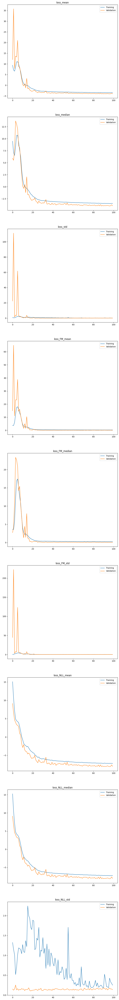

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.test()

 24%|██▍       | 48/196 [00:21<01:05,  2.26it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [01:29<00:00,  2.18it/s]


{'loss_mean': -3.9867165088653564,
 'loss_median': -3.990920066833496,
 'loss_std': 0.08140303194522858,
 'loss_FM_mean': 0.08638401329517365,
 'loss_FM_median': 0.07690741121768951,
 'loss_FM_std': 0.04284002259373665,
 'loss_NLL_mean': -8.05981731414795,
 'loss_NLL_median': -8.058355331420898,
 'loss_NLL_std': 0.147480309009552}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
N_SAMPLES_PER_MODEL = 1_000

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model"
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM"
)


benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'a': 5.0, 'b': 2.0, 'alpha_betadist': 0.5, 'beta_betadist': 0.5}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)


                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()


                with pyro.plate("beta_plate", x.shape[1]):
                        beta = pyro.sample("beta", dist.Beta(alpha_betadist, beta_betadist))
                
                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                #print(f"beta: {beta.shape}")
                #print(f"x: {x.shape}")
                #print(f"mean: {mean.shape}")
                #print(f"sigma_squared: {sigma_squared.shape}")

                with pyro.plate("data", len(x)):
                        y = pyro.sample("obs", pyro.distributions.Normal(mean, sig

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        full_model_no_FM,
                        vi_diag,
                        vi_multivariate_normal,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        hmc_sampler
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

torch.Size([250000, 10])
The save path /content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/PFN_Experiments_CFM_InvGammaBetaPrior_LearnedBaseDist_plus_nll_v1 does not exist, creating it


In [49]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:11<18:09, 11.01s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:21<17:41, 10.83s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:32<17:29, 10.82s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:43<17:19, 10.82s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:54<17:16, 10.91s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:05<17:02, 10.88s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:15<16:47, 10.84s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:26<16:40, 10.88s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:37<16:24, 10.82s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:48<16:11, 10.80s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:59<16:07, 10.87s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:10<15:53, 10.84s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:20<15:40, 10.81s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:31<15:33, 10.86s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:42<15:20, 10.83s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:53<15:05, 10.78s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:04<15:00, 10.85s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:15<14:47, 10.82s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:25<14:31, 10.76s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:36<14:26, 10.83s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:47<14:13, 10.80s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:58<14:00, 10.78s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:09<13:55, 10.85s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:19<13:42, 10.82s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:30<13:28, 10.78s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:41<13:23, 10.86s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:52<13:10, 10.82s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:03<12:58, 10.81s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:13<12:46, 10.79s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:24<12:38, 10.84s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:35<12:25, 10.80s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:46<12:12, 10.77s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:57<12:06, 10.84s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [06:08<11:54, 10.83s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:18<11:41, 10.80s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:29<11:35, 10.87s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:40<11:20, 10.81s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:51<11:08, 10.78s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [07:02<11:03, 10.87s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:13<10:52, 10.88s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:24<10:40, 10.85s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:35<10:33, 10.92s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:45<10:20, 10.89s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:56<10:07, 10.85s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [08:07<09:59, 10.90s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:18<09:46, 10.85s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:29<09:32, 10.80s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:39<09:20, 10.77s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:50<09:12, 10.84s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [09:01<09:00, 10.82s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:12<08:49, 10.82s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:23<08:42, 10.90s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:34<08:30, 10.86s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:44<08:17, 10.81s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [09:55<08:09, 10.87s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [10:06<07:56, 10.82s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:17<07:44, 10.81s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:28<07:36, 10.87s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:39<07:24, 10.83s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [10:50<07:13, 10.83s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [11:00<07:03, 10.87s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [11:11<06:51, 10.83s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:22<06:39, 10.81s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:33<06:27, 10.78s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [11:44<06:19, 10.84s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [11:54<06:07, 10.79s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [12:05<05:55, 10.78s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [12:16<05:47, 10.87s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:27<05:35, 10.83s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:38<05:24, 10.82s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [12:49<05:15, 10.87s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [12:59<05:03, 10.84s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [13:10<04:52, 10.82s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [13:21<04:43, 10.88s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [13:32<04:30, 10.82s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [13:43<04:19, 10.80s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [13:53<04:08, 10.78s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [14:04<03:58, 10.83s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [14:15<03:46, 10.79s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [14:26<03:36, 10.80s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [14:37<03:26, 10.87s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [14:48<03:15, 10.83s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [14:58<03:03, 10.82s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [15:10<02:54, 10.91s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [15:20<02:42, 10.87s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [15:31<02:31, 10.80s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [15:42<02:21, 10.86s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [15:53<02:09, 10.80s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [16:03<01:58, 10.75s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [16:14<01:48, 10.85s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [16:25<01:37, 10.83s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [16:36<01:26, 10.81s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [16:47<01:15, 10.78s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [16:58<01:05, 10.84s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [17:08<00:54, 10.81s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [17:19<00:43, 10.78s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [17:30<00:32, 10.86s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [17:41<00:21, 10.83s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [17:52<00:10, 10.82s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:12<21:03, 12.77s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:25<20:56, 12.83s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:38<20:57, 12.97s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:51<20:32, 12.84s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:04<20:12, 12.77s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:17<20:12, 12.89s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:29<19:53, 12.84s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:42<19:47, 12.91s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:55<19:31, 12.87s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:08<19:12, 12.81s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:21<19:05, 12.87s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:34<18:46, 12.80s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:46<18:34, 12.81s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:00<18:32, 12.94s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:12<18:14, 12.87s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:25<17:58, 12.83s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:38<17:51, 12.91s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:51<17:42, 12.96s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:04<17:25, 12.90s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:17<17:20, 13.00s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:30<17:04, 12.97s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:43<16:50, 12.95s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:56<16:43, 13.03s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:09<16:27, 12.99s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:22<16:13, 12.97s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:35<16:04, 13.03s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:48<15:45, 12.95s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:01<15:31, 12.93s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:14<15:22, 12.99s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:27<15:04, 12.92s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:40<14:50, 12.91s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:53<14:41, 12.96s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:06<14:28, 12.96s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:19<14:12, 12.91s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:32<14:01, 12.95s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:44<13:46, 12.91s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:57<13:35, 12.94s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:10<13:24, 12.98s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:23<13:07, 12.92s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:36<12:53, 12.89s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:49<12:44, 12.95s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:02<12:30, 12.94s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:15<12:13, 12.87s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:28<12:03, 12.91s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:41<11:51, 12.94s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:54<11:36, 12.91s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:07<11:23, 12.90s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:19<11:11, 12.91s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:32<10:56, 12.87s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:45<10:45, 12.91s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:58<10:30, 12.87s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:11<10:17, 12.86s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:24<10:06, 12.91s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:37<09:51, 12.86s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:50<09:43, 12.97s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [12:03<09:29, 12.94s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:15<09:13, 12.86s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:28<09:02, 12.92s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:41<08:48, 12.88s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:54<08:34, 12.87s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [13:07<08:24, 12.94s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:20<08:09, 12.88s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:33<07:55, 12.86s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:46<07:44, 12.91s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:58<07:29, 12.84s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [14:11<07:14, 12.78s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:24<07:04, 12.88s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:37<06:49, 12.80s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:50<06:36, 12.79s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [15:03<06:25, 12.86s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [15:15<06:11, 12.83s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:28<05:59, 12.83s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:41<05:48, 12.91s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:54<05:34, 12.85s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [16:07<05:20, 12.81s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:20<05:11, 12.97s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:33<04:57, 12.92s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:46<04:43, 12.87s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:59<04:30, 12.89s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [17:11<04:16, 12.84s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [17:24<04:04, 12.87s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:37<03:52, 12.91s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:50<03:38, 12.83s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [18:03<03:24, 12.80s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [18:16<03:14, 12.95s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [18:29<03:00, 12.89s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:42<02:47, 12.91s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:54<02:34, 12.87s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [19:07<02:21, 12.86s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [19:20<02:09, 12.93s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:33<01:55, 12.87s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:46<01:42, 12.86s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:59<01:30, 12.94s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [20:12<01:17, 12.92s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [20:25<01:04, 12.84s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:38<00:51, 12.95s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:51<00:39, 13.03s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [21:04<00:26, 13.01s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [21:17<00:13, 13.04s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<15:39,  9.49s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:19<15:48,  9.68s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:28<15:31,  9.60s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:38<15:18,  9.56s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:47<15:07,  9.56s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:57<15:05,  9.63s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:07<14:53,  9.61s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:16<14:41,  9.58s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:26<14:29,  9.55s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:35<14:23,  9.59s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:45<14:10,  9.56s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:54<14:00,  9.55s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:04<13:56,  9.62s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:14<13:43,  9.57s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:23<13:31,  9.55s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:33<13:28,  9.62s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:42<13:15,  9.58s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:52<13:03,  9.55s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:02<12:59,  9.63s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:11<12:48,  9.60s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:21<12:37,  9.59s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:30<12:27,  9.59s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:40<12:22,  9.64s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:50<12:09,  9.61s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [03:59<11:57,  9.57s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:09<11:54,  9.65s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:18<11:41,  9.61s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:28<11:29,  9.58s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:38<11:19,  9.57s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:47<11:14,  9.64s/it]

....................


Sampling posterior:  31%|███       | 31/100 [04:57<11:02,  9.60s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:06<10:51,  9.58s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:16<10:45,  9.64s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:26<10:33,  9.60s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:35<10:23,  9.60s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:45<10:13,  9.59s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:55<10:08,  9.66s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:04<09:57,  9.64s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:14<09:46,  9.62s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:24<09:40,  9.68s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:33<09:28,  9.64s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:43<09:17,  9.61s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:52<09:06,  9.59s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:02<09:00,  9.65s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:12<08:49,  9.62s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:21<08:38,  9.61s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:31<08:33,  9.70s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:41<08:22,  9.66s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:50<08:10,  9.62s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:00<08:05,  9.71s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:10<07:54,  9.68s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:19<07:42,  9.65s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:29<07:32,  9.63s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:39<07:25,  9.69s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:48<07:13,  9.64s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [08:58<07:03,  9.62s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:08<06:58,  9.73s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:17<06:46,  9.67s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:27<06:35,  9.65s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:37<06:25,  9.64s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:46<06:17,  9.69s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [09:56<06:06,  9.64s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [10:05<05:55,  9.60s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [10:15<05:47,  9.66s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:25<05:37,  9.63s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:34<05:26,  9.61s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:44<05:18,  9.66s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [10:54<05:07,  9.62s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [11:03<04:57,  9.59s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [11:13<04:46,  9.57s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [11:22<04:39,  9.64s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:32<04:28,  9.60s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:42<04:19,  9.61s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:51<04:11,  9.68s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [12:01<04:00,  9.63s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [12:11<03:50,  9.61s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [12:20<03:40,  9.58s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:30<03:31,  9.63s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:39<03:22,  9.63s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:49<03:11,  9.59s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [12:59<03:03,  9.63s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [13:08<02:52,  9.60s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [13:18<02:42,  9.57s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [13:27<02:34,  9.63s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [13:37<02:23,  9.59s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:47<02:14,  9.59s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [13:56<02:04,  9.56s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [14:06<01:55,  9.62s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [14:15<01:45,  9.59s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [14:25<01:35,  9.58s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [14:35<01:26,  9.63s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:44<01:16,  9.62s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [14:54<01:07,  9.58s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [15:03<00:57,  9.57s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [15:13<00:48,  9.63s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [15:23<00:38,  9.62s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [15:32<00:28,  9.61s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [15:42<00:19,  9.71s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [15:52<00:09,  9.65s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:14<23:35, 14.29s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:28<23:07, 14.16s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:42<23:05, 14.29s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:56<22:43, 14.21s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:10<22:25, 14.17s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:25<22:17, 14.23s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:39<22:00, 14.20s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:53<21:50, 14.25s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:07<21:32, 14.20s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:22<21:23, 14.27s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:36<21:03, 14.20s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:50<20:46, 14.16s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:04<20:36, 14.21s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:18<20:16, 14.15s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:33<20:07, 14.20s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:47<19:50, 14.17s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:01<19:38, 14.20s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:15<19:21, 14.16s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:29<19:03, 14.11s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:43<18:53, 14.17s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:58<18:38, 14.16s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:12<18:29, 14.22s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:26<18:12, 14.18s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:40<17:54, 14.14s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:54<17:45, 14.21s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:08<17:26, 14.15s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:23<17:15, 14.19s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:37<16:58, 14.15s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:51<16:50, 14.23s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:05<16:33, 14.20s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:19<16:16, 14.15s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:34<16:07, 14.23s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:48<15:51, 14.20s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [08:02<15:40, 14.25s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:16<15:23, 14.21s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:31<15:11, 14.25s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:45<14:53, 14.19s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:59<14:36, 14.14s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:13<14:25, 14.18s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:27<14:08, 14.14s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:41<13:58, 14.22s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:56<13:41, 14.17s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:10<13:29, 14.20s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:24<13:13, 14.17s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [10:38<13:02, 14.22s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:52<12:45, 14.18s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:06<12:29, 14.14s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:21<12:17, 14.19s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [11:35<12:01, 14.15s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [11:49<11:50, 14.21s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [12:03<11:35, 14.19s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:18<11:23, 14.23s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [12:32<11:05, 14.17s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [12:46<10:50, 14.14s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [13:00<10:39, 14.20s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:14<10:22, 14.15s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [13:28<10:11, 14.23s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [13:43<09:56, 14.19s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [13:57<09:43, 14.23s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:11<09:28, 14.21s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [14:25<09:12, 14.17s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [14:39<09:00, 14.22s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [14:53<08:44, 14.16s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:08<08:33, 14.25s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [15:22<08:17, 14.22s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [15:36<08:01, 14.17s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [15:50<07:48, 14.21s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [16:04<07:33, 14.18s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [16:19<07:20, 14.22s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [16:33<07:05, 14.19s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [16:47<06:53, 14.27s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [17:02<06:38, 14.22s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [17:16<06:23, 14.20s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [17:30<06:10, 14.24s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [17:44<05:54, 14.19s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [17:58<05:41, 14.23s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [18:12<05:26, 14.18s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [18:27<05:13, 14.25s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [18:41<04:58, 14.21s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [18:55<04:43, 14.17s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [19:10<04:31, 14.26s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [19:24<04:16, 14.23s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [19:38<04:02, 14.29s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [19:52<03:47, 14.24s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [20:07<03:34, 14.32s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [20:21<03:20, 14.29s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [20:35<03:06, 14.34s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [20:50<02:51, 14.28s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [21:04<02:36, 14.26s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [21:18<02:23, 14.33s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [21:32<02:08, 14.29s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [21:47<01:54, 14.32s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [22:01<01:39, 14.27s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [22:15<01:26, 14.33s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [22:30<01:11, 14.29s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [22:44<00:56, 14.25s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [22:58<00:42, 14.30s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [23:12<00:28, 14.26s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [23:27<00:14, 14.30s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<27:07, 16.44s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:32<26:54, 16.47s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:49<26:34, 16.44s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:05<26:17, 16.44s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:22<26:03, 16.46s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:38<25:42, 16.41s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:55<25:32, 16.48s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:11<25:05, 16.36s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:27<24:57, 16.46s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:44<24:35, 16.39s/it]

....................


Sampling posterior:  11%|█         | 11/100 [03:00<24:21, 16.42s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:17<24:07, 16.45s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:33<23:48, 16.42s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:49<23:25, 16.34s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:06<23:15, 16.41s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:22<23:01, 16.45s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:39<22:48, 16.49s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:55<22:33, 16.50s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:12<22:12, 16.45s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:28<21:55, 16.44s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:45<21:37, 16.43s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [06:01<21:17, 16.37s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:17<21:04, 16.42s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:34<20:51, 16.47s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:50<20:34, 16.46s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [07:07<20:19, 16.47s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:23<19:56, 16.38s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:40<19:50, 16.53s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:56<19:28, 16.46s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:13<19:08, 16.41s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:29<18:53, 16.43s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:46<18:43, 16.52s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [09:02<18:26, 16.51s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:19<18:09, 16.51s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:35<17:49, 16.46s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:52<17:35, 16.49s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [10:08<17:14, 16.43s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:25<17:06, 16.56s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:41<16:44, 16.47s/it]

....................


Sampling posterior:  40%|████      | 40/100 [10:58<16:28, 16.48s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:14<16:11, 16.46s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:31<15:59, 16.54s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:47<15:37, 16.44s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [12:04<15:25, 16.52s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:20<15:04, 16.44s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:36<14:50, 16.49s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [12:53<14:32, 16.46s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [13:10<14:19, 16.54s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:26<13:57, 16.43s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:42<13:46, 16.52s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [13:59<13:25, 16.45s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:16<13:14, 16.54s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:32<12:53, 16.45s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:49<12:44, 16.62s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [15:05<12:23, 16.51s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:22<12:09, 16.58s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:38<11:49, 16.49s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [15:54<11:30, 16.44s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [16:11<11:17, 16.52s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:28<11:05, 16.63s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:44<10:44, 16.52s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [17:01<10:27, 16.52s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:17<10:08, 16.45s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:34<09:56, 16.57s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:50<09:35, 16.45s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [18:07<09:22, 16.54s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:23<09:06, 16.56s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:40<08:51, 16.60s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [18:56<08:29, 16.45s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [19:13<08:13, 16.44s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:29<07:57, 16.48s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:46<07:41, 16.47s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [20:02<07:25, 16.51s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [20:19<07:10, 16.55s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:35<06:50, 16.43s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [20:52<06:34, 16.44s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [21:08<06:18, 16.45s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [21:25<06:02, 16.47s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:41<05:46, 16.48s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [21:58<05:31, 16.58s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [22:14<05:13, 16.49s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [22:31<04:57, 16.54s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:47<04:41, 16.56s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [23:04<04:26, 16.67s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [23:21<04:09, 16.61s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:37<03:51, 16.55s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [23:54<03:34, 16.52s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [24:10<03:18, 16.52s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [24:27<03:01, 16.47s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:43<02:44, 16.50s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [24:59<02:27, 16.40s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [25:16<02:11, 16.46s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [25:32<01:55, 16.45s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:49<01:39, 16.52s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [26:05<01:22, 16.42s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [26:22<01:06, 16.52s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:38<00:49, 16.47s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [26:55<00:32, 16.43s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [27:11<00:16, 16.45s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 502.63it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [05:29<00:00,  3.30s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,16.210842,0.056933,0.51145,6.741503,0.108884,0.102586,0.001205,0.000030,0.032476,5.576519,0.060370,0.052740
1,full_model_no_FM,gt,16.207927,0.056942,0.50915,7.181619,0.109829,0.103019,0.001162,0.000027,0.039048,4.964181,0.054406,0.052053
2,Variational Inference with guide: AutoDiagonal...,gt,16.205219,0.056970,0.50905,0.852610,0.103428,0.102299,0.000559,0.000018,0.029718,15.455942,0.059708,0.055725
3,Variational Inference with guide: AutoMultivar...,gt,16.205190,0.056971,0.50840,8.699968,0.101061,0.099486,0.000914,0.000028,0.033747,6.006220,0.059617,0.051984
4,Variational Inference with guide: AutoLaplaceA...,gt,16.198437,0.056999,0.54280,NaN,NaN,0.101989,0.000000,0.000000,0.030537,NaN,NaN,0.050947
5,Variational Inference with guide: AutoIAFNorma...,gt,16.203338,0.057009,0.52345,7.463777,0.116439,0.115550,0.000912,0.000029,0.033270,4.957827,0.059141,0.051251
6,Variational Inference with guide: AutoStructur...,gt,16.205481,0.056979,0.50680,8.813598,0.101111,0.100984,0.000999,0.000031,0.036024,5.797609,0.058511,0.053583
7,Hamiltonian Monte Carlo,gt,16.208044,0.056953,0.50955,9.016289,0.102555,0.097544,0.001059,0.000028,0.031878,5.143063,0.059987,0.051828


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,1.218996e-17,1.639672e-02,6.220019e-01,3.003845e-02,5.611886e-01,6.012350e-01
1,full_model,Variational Inference with guide: AutoDiagonal...,3.896120e-18,4.338588e-13,7.229586e-01,5.663195e-06,7.864670e-03,4.597614e-01
2,full_model,Variational Inference with guide: AutoMultivar...,3.895461e-18,3.259723e-12,5.658210e-01,1.924885e-11,5.423295e-05,2.634027e-02
3,full_model,Variational Inference with guide: AutoLaplaceA...,3.896120e-18,6.307739e-18,2.344022e-10,NaN,NaN,9.151158e-01
4,full_model,Variational Inference with guide: AutoIAFNorma...,3.895681e-18,8.021622e-18,5.008114e-03,2.542318e-02,4.708870e-03,8.643690e-07
5,full_model,Variational Inference with guide: AutoStructur...,3.896560e-18,3.540528e-13,4.418738e-01,8.178235e-12,3.927428e-04,2.637996e-01
6,full_model,Hamiltonian Monte Carlo,9.892465e-18,1.996659e-05,7.985876e-01,7.525780e-14,1.639728e-02,2.858683e-05
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,4.396866e-18,3.298327e-12,8.824506e-01,8.199514e-07,3.395594e-03,3.391458e-01
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,4.265843e-18,1.149658e-09,7.687539e-01,2.929781e-10,2.858683e-05,4.836758e-03
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,4.669634e-18,4.195334e-08,NaN,NaN,4.723813e-01



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,full_model,full_model_no_FM,0.250559,0.044009,0.616290,0.080815,0.019797,0.043649
1,full_model,Variational Inference with guide: AutoDiagonal...,0.332107,0.808329,0.966665,0.126214,0.263950,0.010627
2,full_model,Variational Inference with guide: AutoMultivar...,0.289584,0.256903,0.929805,0.098652,0.180319,0.025886
3,full_model,Variational Inference with guide: AutoLaplaceA...,0.445815,2.477356,1.000000,0.134160,0.178932,0.000000
4,full_model,Variational Inference with guide: AutoIAFNorma...,0.380003,0.623991,0.944020,0.131933,0.498736,0.028690
5,full_model,Variational Inference with guide: AutoStructur...,0.292516,0.269179,0.930460,0.104852,0.180572,0.025951
6,full_model,Hamiltonian Monte Carlo,0.274303,0.156454,0.921245,0.088006,0.152098,0.031870
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.326110,0.767574,0.954485,0.124061,0.243134,0.012660
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,0.278066,0.204961,0.900195,0.096158,0.162458,0.031033
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,0.434018,2.362351,1.000000,0.135349,0.139365,0.000000


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,3.658599e-07,2.562144e-34,2.547033e-34
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoMultivar...,3.407097e-03,1.401759e-32,2.558538e-34
2,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoLaplaceA...,2.504124e-23,2.562144e-34,5.636285e-39
3,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoIAFNorma...,4.558999e-14,3.161401e-34,2.558538e-34
4,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoStructur...,3.380414e-03,1.837348e-33,2.558106e-34
...,...,...,...,...,...,...,...
163,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,5.732676e-04,5.481899e-33,5.635456e-39
164,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,7.870083e-17,2.562144e-34,5.630901e-39
165,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,1.504527e-01,3.904226e-01,2.104972e-07
166,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,3.806631e-06,5.786693e-16,3.192730e-02


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2  Variational Inference with guide: AutoDiagonal...  gt   
  3  Variational Inference with guide: AutoMultivar...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  7                            Hamiltonian Monte Carlo  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          16.210842            0.056933   
  1                                          16.207927            0.056942   
  2                                          16.205219            0.056970   
  3                                          16.205190            0.056971   
  4    

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

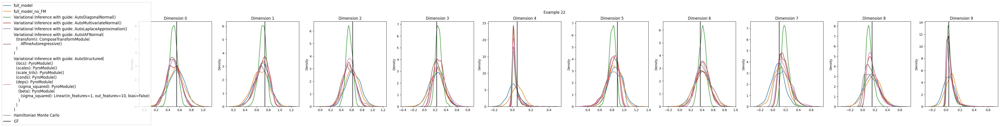

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

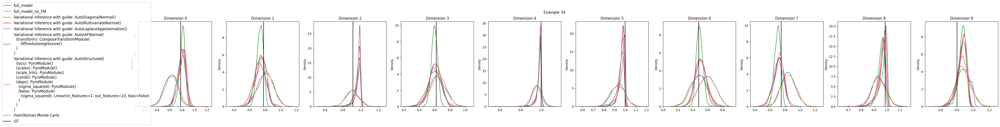

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

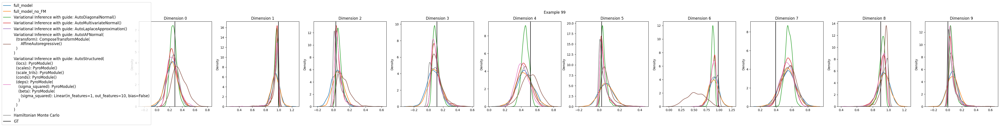

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

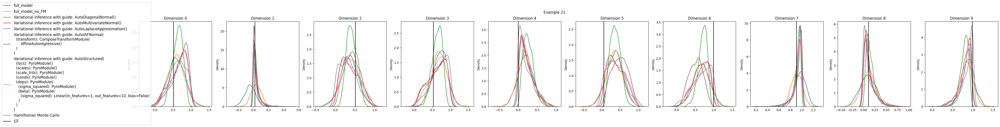

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

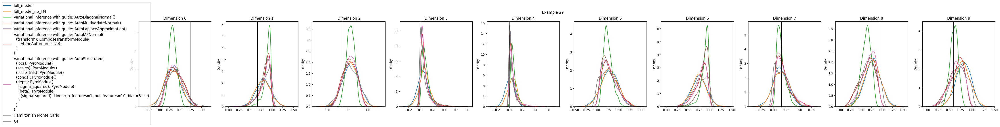

In [50]:
evaluation.plot_results()